<table align="center" width=60%>
    <tr>
        <td>
            <div align="center">
                <font color="#7F0542 ">
                    <b><h1>Movie Recommender System</h1>
                    </b>
                </font>
            </div>
        </td>
    </tr>
</table>

## Problem Statement:🎥🍿
Create a Recommender System to show personalized movie recommendations based on ratings given by a user and other users similar to them in order to improve user experience.

## Data Description:

#### MOVIES FILE DESCRIPTION
================================================================================

Movie information is in the file "movies.dat" and is in the following
format:

MovieID::Title::Genres

- Titles are identical to titles provided by the IMDB (including
year of release)
- Genres are pipe-separated and are selected from the following genres:

	* Action
	* Adventure
	* Animation
	* Children's
	* Comedy
	* Crime
	* Documentary
	* Drama
	* Fantasy
	* Film-Noir
	* Horror
	* Musical
	* Mystery
	* Romance
	* Sci-Fi
	* Thriller
	* War
	* Western

### RATINGS FILE DESCRIPTION
================================================================================

All ratings are contained in the file "ratings.dat" and are in the
following format:

UserID::MovieID::Rating::Timestamp

- UserIDs range between 1 and 6040 
- MovieIDs range between 1 and 3952
- Ratings are made on a 5-star scale (whole-star ratings only)
- Timestamp is represented in seconds
- Each user has at least 20 ratings

#### USERS FILE DESCRIPTION
================================================================================

User information is in the file "users.dat" and is in the following
format:

UserID::Gender::Age::Occupation::Zip-code

All demographic information is provided voluntarily by the users and is
not checked for accuracy.  
Only users who have provided some demographic
information are included in this data set.

- Gender is denoted by a "M" for male and "F" for female
- Age is chosen from the following ranges:

	*  1:  "Under 18"
	* 18:  "18-24"
	* 25:  "25-34"
	* 35:  "35-44"
	* 45:  "45-49"
	* 50:  "50-55"
	* 56:  "56+"

- Occupation is chosen from the following choices:

	*  0:  "other" or not specified
	*  1:  "academic/educator"
	*  2:  "artist"
	*  3:  "clerical/admin"
	*  4:  "college/grad student"
	*  5:  "customer service"
	*  6:  "doctor/health care"
	*  7:  "executive/managerial"
	*  8:  "farmer"
	*  9:  "homemaker"
	* 10:  "K-12 student"
	* 11:  "lawyer"
	* 12:  "programmer"
	* 13:  "retired"
	* 14:  "sales/marketing"
	* 15:  "scientist"
	* 16:  "self-employed"
	* 17:  "technician/engineer"
	* 18:  "tradesman/craftsman"
	* 19:  "unemployed"
	* 20:  "writer"

### Our Approach:

In this project, we'll be building a recommender system that is going to recommend movies to a user based on their preferences as well as the choices of other users who are similar to them.

#### **What is a Recommender System?**

A recommender engine, or a recommendation system is a subclass of information filtering system that seeks to predict the "rating" or "preference" a user would give to an item.

#### **Types of Recommender Systems -**

Recommender systems usually make use of either or both *Collaborative Filtering* and *Content-based Filtering* techniques.

#### **Collaborative Filtering**

Collaborative filtering is based on the assumption that people who agreed in the past will agree in the future, and that they will like similar kinds of items as they liked in the past. The system generates recommendations using only information about rating profiles for different users or items. By locating peer users/items with a rating history similar to the current user or item, they generate recommendations using this neighborhood.

#### **Content-based Filtering**

Content-based filtering methods are based on a description of the item and a profile of the user's preferences. These methods are best suited to situations where there is known data on an item (name, location, description, etc.), but not on the user. Content-based recommenders treat recommendation as a user-specific classification problem and learn a classifier for the user's likes and dislikes based on an item's features.

## Table of Contents

1. **[Import Libraries](#import_lib)**
2. **[Set Options](#set_options)**
3. **[Read Data & Data Formatting](#Read_Data)**
    - 3.1 -[Movies](#mov)
    - 3.2 -[Ratings](#rat)
    - 3.3 -[Users](#user)
4. **[Exploratory Data Analysis](#data_preparation)**
    - 4.1 - [Preparing the Dataset](#Data_Preparing)
        - 4.1.1 - [Merging datasets](#merging)
        - 4.1.2 - [Missing Values](#Missing_Values)
        - 4.1.3 - [Feature Engineering](#Feat_eng)
    - 4.2 - [Understanding the Dataset](#Data_Understanding)
        - 4.2.1 - [Analyze Features](#analyze_fea)
5. **[Recommendations systems](#rec_sys)**
    - 5.1 - [Pearson Correlation](#pear)
    - 5.2 - [Cosine Similarty](#cosine)
         - 5.2.1 - [Item-Based Similarity](#itm_sim)
         - 5.2.2 - [User-Based Similarity](#user_sim)
    - 5.3 - [Nearest Neighbors](#nn)
    - 5.4 - [Matrix Factorization](#mf)
        - 5.4.1 - [Using cmfrec library](#cmfrec)
        - 5.4.2 - [Using surprise library](#surp)
    - 5.5 - [User-Based Approach(optional)](#user_based)
    - 5.6 - [Regression-Based System](#reg)
    - 5.7 - [Ensemble Recommender System](#ene)

# 1. Import Libraries <a id='import_lib'></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict 
from scipy import sparse
from scipy.stats import pearsonr
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import NearestNeighbors
import warnings
!pip install cmfrec
from cmfrec import CMF
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.3/268.3 kB 5.5 MB/s eta 0:00:00
  Installing build dependencies ... - \ | / - \ | / - \ | / - \ | / - \ done
  Getting requirements to build wheel ... - done
  Preparing metadata (pyproject.toml) ... - done
  Using cached findblas-0.1.21-py3-none-any.whl
  Created wheel for cmfrec: filename=cmfrec-3.5.1.post4-cp310-cp310-linux_x86_64.whl size=1513782 sha256=c0974697b1ac8e19a715019c8caed879dd8be434510193d449daa6f549097f28
  Stored in directory: /root/.cache/pip/wheels/61/eb/24/060c47f69b3fd7ac6193e7f7858ce44ae0320076928fbc83f3
Successfully built cmfrec


# 2. Set Options <a id='set_options'></a>

In [2]:
warnings.simplefilter('ignore')
pd.set_option("display.max_columns", None)
pd.options.display.float_format = '{:.2f}'.format
sns.set_style('white')

# 3. Read Data & Data Formatting<a id='Read_Data'></a>

### 3.1 Movies <a id='mov'></a>

In [4]:
movies = pd.read_fwf('/kaggle/input/movies-recommender-system-dataset/ml-1m/movies.dat',encoding='ISO-8859-1',header=None)

In [5]:
movies.shape

(3883, 3)

In [6]:
movies.head()

,0,1,2
0,1::Toy Story (1995)::Animation|Children's|Comedy,NaN,NaN
1,2::Jumanji (1995)::Adventure|Children's|Fantasy,NaN,NaN
2,3::Grumpier Old Men (1995)::Comedy|Romance,NaN,NaN
3,4::Waiting to Exhale (1995)::Comedy|Drama,NaN,NaN
4,5::Father of the Bride Part II (1995)::Comedy,NaN,NaN


In [7]:
movies.columns

Int64Index([0, 1, 2], dtype='int64')

In [8]:
movies.drop(columns=[1,2],axis=1,inplace=True)

In [9]:
movies.head()

,0
0,1::Toy Story (1995)::Animation|Children's|Comedy
1,2::Jumanji (1995)::Adventure|Children's|Fantasy
2,3::Grumpier Old Men (1995)::Comedy|Romance
3,4::Waiting to Exhale (1995)::Comedy|Drama
4,5::Father of the Bride Part II (1995)::Comedy


In [10]:
movies.columns = ['Movie ID::Title::Genres']

In [11]:
movies.head()

,Movie ID::Title::Genres
0,1::Toy Story (1995)::Animation|Children's|Comedy
1,2::Jumanji (1995)::Adventure|Children's|Fantasy
2,3::Grumpier Old Men (1995)::Comedy|Romance
3,4::Waiting to Exhale (1995)::Comedy|Drama
4,5::Father of the Bride Part II (1995)::Comedy


In [12]:
delimiter = '::'
movies = movies['Movie ID::Title::Genres'].str.split(delimiter,expand=True)
movies.columns = ['Movie ID', 'Title', 'Genres']

In [13]:
movies.rename(columns={'Movie ID':'MovieID'},inplace=True)
movies1=movies.copy()
movies.head()

,MovieID,Title,Genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy


### 3.2 Ratings <a id='rat'></a>

In [14]:
ratings = pd.read_fwf('/kaggle/input/movies-recommender-system-dataset/ml-1m/ratings.dat',encoding='ISO-8859-1',header=None)

In [15]:
ratings.shape

(1000209, 1)

In [16]:
ratings.head()

,0
0,1::1193::5::978300760
1,1::661::3::978302109
2,1::914::3::978301968
3,1::3408::4::978300275
4,1::2355::5::978824291


In [17]:
ratings.columns = ['UserID::MovieID::Rating::Timestamp']

In [18]:
ratings.head()

,UserID::MovieID::Rating::Timestamp
0,1::1193::5::978300760
1,1::661::3::978302109
2,1::914::3::978301968
3,1::3408::4::978300275
4,1::2355::5::978824291


In [19]:
ratings = ratings['UserID::MovieID::Rating::Timestamp'].str.split(delimiter,expand=True)
ratings.columns = ['UserID','MovieID', 'Rating', 'Timestamp']

In [20]:
ratings.shape

(1000209, 4)

In [21]:
ratings1=ratings.copy()
ratings.head()

,UserID,MovieID,Rating,Timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291


### 3.3 Users <a id='user'></a>

In [22]:
users = pd.read_fwf('/kaggle/input/movies-recommender-system-dataset/ml-1m/users.dat',encoding='ISO-8859-1',header=None)

In [23]:
users.columns = ['UserID::Gender::Age::Occupation::Zip-code']

In [24]:
users = users['UserID::Gender::Age::Occupation::Zip-code'].str.split(delimiter, expand=True)
users.columns = ['UserID', 'Gender', 'Age', 'Occupation', 'Zip-code']
users1=users.copy()

In [25]:
users.replace({'Age':{'1':  "Under 18",
                      '18':  "18-24",
                      '25':  "25-34",
                      '35':  "35-44",
                      '45':  "45-49",
                      '50':  "50-55",
                      '56':  "56 Above"}}, inplace=True)

In [26]:
users.replace({'Occupation':{'0': "other",
                             '1': "academic/educator",
                             '2': "artist",
                             '3': "clerical/admin",
                             '4': "college/grad student",
                             '5': "customer service",
                             '6': "doctor/health care",
                             '7': "executive/managerial",
                             '8': "farmer",
                             '9': "homemaker",
                             '10': "k-12 student",
                             '11': "lawyer",
                             '12': "programmer",
                             '13': "retired",
                             '14': "sales/marketing",
                             '15': "scientist",
                             '16': "self-employed",
                             '17': "technician/engineer",
                             '18': "tradesman/craftsman",
                             '19': "unemployed",
                             '20': "writer"}}, inplace=True)

In [27]:
users.shape

(6040, 5)

In [28]:
users.head()

,UserID,Gender,Age,Occupation,Zip-code
0,1,F,Under 18,k-12 student,48067
1,2,M,56 Above,self-employed,70072
2,3,M,25-34,scientist,55117
3,4,M,45-49,executive/managerial,02460
4,5,M,25-34,writer,55455


# 4. Exploratory Data Analysis <a id='data_preparation'></a>

## 4.1 Preparing the Dataset <a id='Data_Preparing'></a>

In [29]:
#Using regular expressions to find a year stored between parentheses
#We specify the parantheses so we don't conflict with movies that have years in their titles
movies['Year'] = movies.Title.str.extract('(\(\d\d\d\d\))',expand=False)

#Removing the parentheses
movies['Year'] = movies.Year.str.extract('(\d\d\d\d)',expand=False)

#Removing the years from the 'Title' column
movies['Title'] = movies.Title.str.replace('(\(\d\d\d\d\))', '')

#Applying the strip function to get rid of any ending whitespace characters that may have appeared
movies['Title'] = movies['Title'].apply(lambda x : x.strip())
movies.head()

,MovieID,Title,Genres,Year
0,1,Toy Story,Animation|Children's|Comedy,1995
1,2,Jumanji,Adventure|Children's|Fantasy,1995
2,3,Grumpier Old Men,Comedy|Romance,1995
3,4,Waiting to Exhale,Comedy|Drama,1995
4,5,Father of the Bride Part II,Comedy,1995


In [30]:
dfmov = movies.copy()
dfmov.dropna(inplace=True)
dfmov.Genres = dfmov.Genres.str.split('|')
dfmov['Genres'] = dfmov['Genres'].apply(lambda x: [i for i in x if i!='A' and i!='D' and i!= 'F' and i!='C' and i!='M' and i!= 'W' and i!= ' '])

for i  in dfmov['Genres']:
    for j in range(len(i)):
        if i[j] == 'Ro' or i[j] == 'Rom' or i[j] == 'Roman' or i[j] == 'R' or i[j] == 'Roma':
            i[j] = 'Romance'
        elif i[j] == 'Chil' or i[j] == 'Childre' or i[j] == 'Childr' or i[j] == "Children'" or i[j] =='Children' or i[j] =='Chi':
            i[j] = "Children's"
        elif i[j] == 'Fantas' or i[j] == 'Fant':
            i[j] = 'Fantasy'
        elif i[j] == 'Dr' or i[j] == 'Dram':
            i[j] = 'Drama'
        elif i[j] == 'Documenta'or i[j] == 'Docu' or i[j] == 'Document' or i[j] == 'Documen':
            i[j] = 'Documentary'
        elif i[j] == 'Wester'or i[j] == 'We':
            i[j] = 'Western'
        elif i[j] == 'Animati':
            i[j] = 'Animation'
        elif i[j] == 'Come'or i[j] == 'Comed' or i[j] == 'Com':
            i[j] = 'Comedy'
        elif i[j] == 'Sci-F'or i[j] == 'S' or i[j] == 'Sci-' or i[j] == 'Sci':
            i[j] = 'Sci-Fi'
        elif i[j] == 'Adv'or i[j] == 'Adventu' or i[j] == 'Adventur' or i[j] == 'Advent':
            i[j] = 'Adventure'
        elif i[j] == 'Horro'or i[j] == 'Horr':
            i[j] = 'Horror'
        elif i[j] == 'Th'or i[j] == 'Thri' or i[j] == 'Thrille':
            i[j] = 'Thriller'
        elif i[j] == 'Acti':
            i[j] = 'Action'
        elif i[j] == 'Wa':
            i[j] = 'War'
        elif i[j] == 'Music':
            i[j] = 'Musical'

In [31]:
dfmov.head()

,MovieID,Title,Genres,Year
0,1,Toy Story,"[Animation, Children's, Comedy]",1995
1,2,Jumanji,"[Adventure, Children's, Fantasy]",1995
2,3,Grumpier Old Men,"[Comedy, Romance]",1995
3,4,Waiting to Exhale,"[Comedy, Drama]",1995
4,5,Father of the Bride Part II,[Comedy],1995


### 4.1.1 Merge all above dataframes <a id='merging'></a>

In [32]:
df_1 = pd.merge(dfmov,ratings,how='inner',on='MovieID')
df_1.head()

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp
0,1,Toy Story,"[Animation, Children's, Comedy]",1995,1,5,978824268
1,1,Toy Story,"[Animation, Children's, Comedy]",1995,6,4,978237008
2,1,Toy Story,"[Animation, Children's, Comedy]",1995,8,4,978233496
3,1,Toy Story,"[Animation, Children's, Comedy]",1995,9,5,978225952
4,1,Toy Story,"[Animation, Children's, Comedy]",1995,10,5,978226474


In [33]:
data = pd.merge(df_1,users,how='inner',on='UserID')
data.head()

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code
0,1,Toy Story,"[Animation, Children's, Comedy]",1995,1,5,978824268,F,Under 18,k-12 student,48067
1,48,Pocahontas,"[Animation, Children's, Musical, Romance]",1995,1,5,978824351,F,Under 18,k-12 student,48067
2,150,Apollo 13,[Drama],1995,1,5,978301777,F,Under 18,k-12 student,48067
3,260,Star Wars: Episode IV - A New Hope,"[Action, Adventure, Fantasy]",1977,1,4,978300760,F,Under 18,k-12 student,48067
4,527,Schindler's List,"[Drama, War]",1993,1,5,978824195,F,Under 18,k-12 student,48067


**Shape of the dataset**

In [34]:
print("No. of rows: ", data.shape[0])
print("No. of columns: ", data.shape[1])

No. of rows:  996144
No. of columns:  11


In [35]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 996144 entries, 0 to 996143
Data columns (total 11 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   MovieID     996144 non-null  object
 1   Title       996144 non-null  object
 2   Genres      996144 non-null  object
 3   Year        996144 non-null  object
 4   UserID      996144 non-null  object
 5   Rating      996144 non-null  object
 6   Timestamp   996144 non-null  object
 7   Gender      996144 non-null  object
 8   Age         996144 non-null  object
 9   Occupation  996144 non-null  object
 10  Zip-code    996144 non-null  object
dtypes: object(11)
memory usage: 91.2+ MB


In this dataset we have **11 object columns**

### 4.1.2 Missing Values <a id='Missing_Values'></a>

In [36]:
missing_value = pd.DataFrame({
    'Missing Value' : data.isnull().sum(),
    'Percentage' : (data.isnull().sum()/len(data))*100
})

In [37]:
missing_value.sort_values(by='Percentage',ascending=False)

,Missing Value,Percentage
MovieID,0,0.00
Title,0,0.00
Genres,0,0.00
Year,0,0.00
UserID,0,0.00
Rating,0,0.00
Timestamp,0,0.00
Gender,0,0.00
Age,0,0.00
Occupation,0,0.00


We have **no missing values** in the dataset

### 4.1.3 Feature Engineering<a id='Feat_eng'></a>

In [38]:
data.columns

Index(['MovieID', 'Title', 'Genres', 'Year', 'UserID', 'Rating', 'Timestamp',
       'Gender', 'Age', 'Occupation', 'Zip-code'],
      dtype='object')

In [39]:
#Change the datatype from object to date_time
data['Datatime'] = pd.to_datetime(data['Timestamp'], unit='s')

#Change the datatype from object to Integer
data['Year'] = data['Year'].astype('int32')

#Change the datatype from object to Integer
data['Rating']=data['Rating'].astype('int32')

In [40]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 996144 entries, 0 to 996143
Data columns (total 12 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   MovieID     996144 non-null  object        
 1   Title       996144 non-null  object        
 2   Genres      996144 non-null  object        
 3   Year        996144 non-null  int32         
 4   UserID      996144 non-null  object        
 5   Rating      996144 non-null  int32         
 6   Timestamp   996144 non-null  object        
 7   Gender      996144 non-null  object        
 8   Age         996144 non-null  object        
 9   Occupation  996144 non-null  object        
 10  Zip-code    996144 non-null  object        
 11  Datatime    996144 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int32(2), object(9)
memory usage: 91.2+ MB


In the data we have **1 datetime, 2 integer and 9 object data type columns**

In [41]:
bins = [1919, 1929, 1939, 1949, 1959, 1969, 1979, 1989, 2000]
labels = ['20s', '30s', '40s', '50s', '60s', '70s', '80s', '90s']
data['ReleaseDec'] = pd.cut(data['Year'], bins=bins, labels=labels)

In [42]:
data.head()

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,Datatime,ReleaseDec
0,1,Toy Story,"[Animation, Children's, Comedy]",1995,1,5,978824268,F,Under 18,k-12 student,48067,2001-01-06 23:37:48,90s
1,48,Pocahontas,"[Animation, Children's, Musical, Romance]",1995,1,5,978824351,F,Under 18,k-12 student,48067,2001-01-06 23:39:11,90s
2,150,Apollo 13,[Drama],1995,1,5,978301777,F,Under 18,k-12 student,48067,2000-12-31 22:29:37,90s
3,260,Star Wars: Episode IV - A New Hope,"[Action, Adventure, Fantasy]",1977,1,4,978300760,F,Under 18,k-12 student,48067,2000-12-31 22:12:40,70s
4,527,Schindler's List,"[Drama, War]",1993,1,5,978824195,F,Under 18,k-12 student,48067,2001-01-06 23:36:35,90s


## 4.2 Understanding the Dataset <a id='Data_Understanding'></a>

### 4.2.1 Analyse Features <a id='analyze_fea'></a>

#### Average User Ratings

In [43]:
user_ratings = data[['UserID','Rating']].groupby('UserID').mean()

Text(0, 0.5, 'Frequency')

<Figure size 800x800 with 0 Axes>

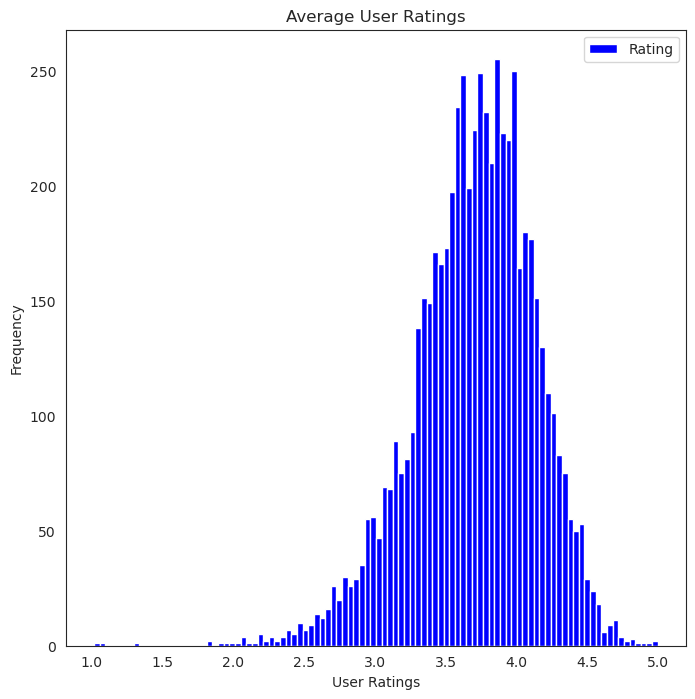

In [44]:
fig = plt.figure(figsize = (8,8))
user_ratings.plot(kind = 'hist', bins = 100, figsize = (8,8), color = 'blue')
plt.plot()
plt.xlabel('User Ratings')
plt.title('Average User Ratings')
plt.ylabel('Frequency')

From above plot, we can see that on average, users are rating movies **3.5-4** more frequently than any other rating. 
This makes sense since people are less inclined to rate movies lower than a 3 if they didn't enjoy the movie. 

#### No. of movies by Release year.

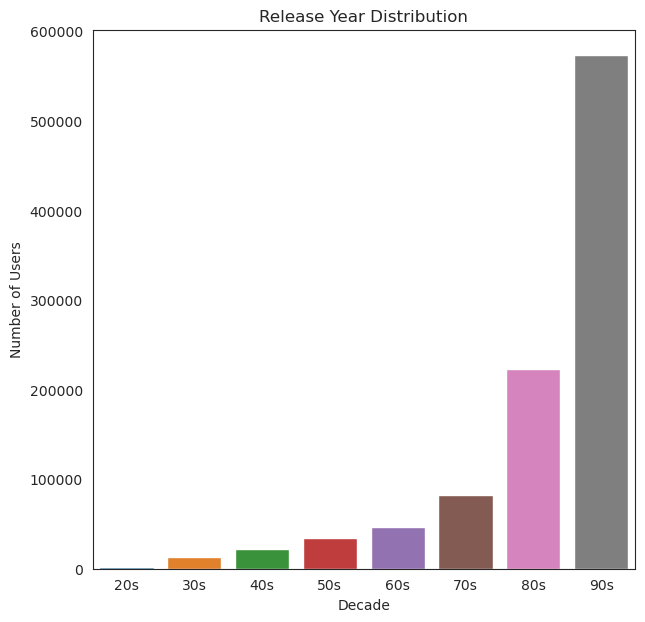

In [45]:
plt.figure(figsize=(7, 7))
sns.countplot(x='ReleaseDec', data=data)
plt.title('Release Year Distribution')
plt.xlabel('Decade')
plt.ylabel('Number of Users')
plt.show()

From the above plot we can infer most of the movies present in the dataset were released in the year **90s**.

#### Top 10 Genres based on movies count

In [46]:
genres_df = pd.get_dummies(dfmov['Genres'].apply(pd.Series).stack()).sum(level=0)
genres_df.head()

,,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


In [47]:
### considering only the genre columns for the test
test = genres_df.iloc[:,0:].sum()
test=test.iloc[1:]
print(test)

Action          501
Adventure       282
Animation       104
Children's      249
Comedy         1189
Crime           210
Documentary     124
Drama          1582
Fantasy          62
Film-Noir        44
Horror          340
Musical         113
Mystery         105
Romance         462
Sci-Fi          265
Thriller        488
War             139
Western          68
dtype: int64


In [48]:
len(test)

18

In [49]:
print(type(pd.to_numeric(test)))
print(type(test.to_numpy().reshape(18,)[0]))
# genre_sum = np.hstack((np.asarray(genre_list).reshape(18,1), test.to_numpy().reshape(18,)))
# genre_sum[:,1] = genre_sum[:,1].astype('int64')
test2 = test.to_numpy().reshape(18,)

<class 'pandas.core.series.Series'>
<class 'numpy.int64'>


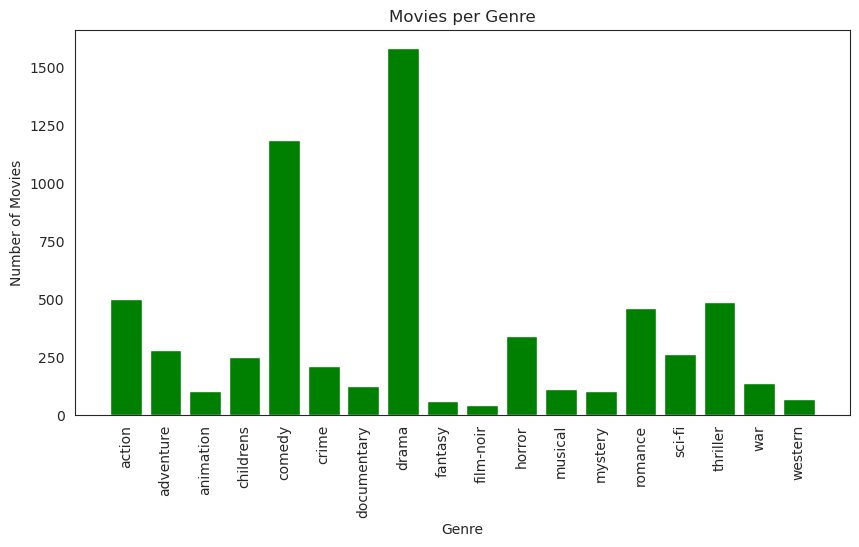

In [50]:
genre_list=['action', 'adventure','animation', 'childrens', 'comedy', 'crime', 'documentary', 'drama','fantasy', 'film-noir', 'horror', 'musical', 'mystery', 'romance', 'sci-fi','thriller', 'war', 'western']
x = np.arange(18)
plt.figure(figsize = (10,5))
plt.bar(x, test2, color = 'g')
plt.xticks(x, genre_list, rotation = 'vertical')
plt.xlabel('Genre')
plt.ylabel('Number of Movies')
plt.title('Movies per Genre')
sns.set(font_scale=1.5)
plt.show()

From the above plot we can infer that most the movies in the dataset belongs to **Comedy** and **Drama** genres.

#### **Distribution by Age -**

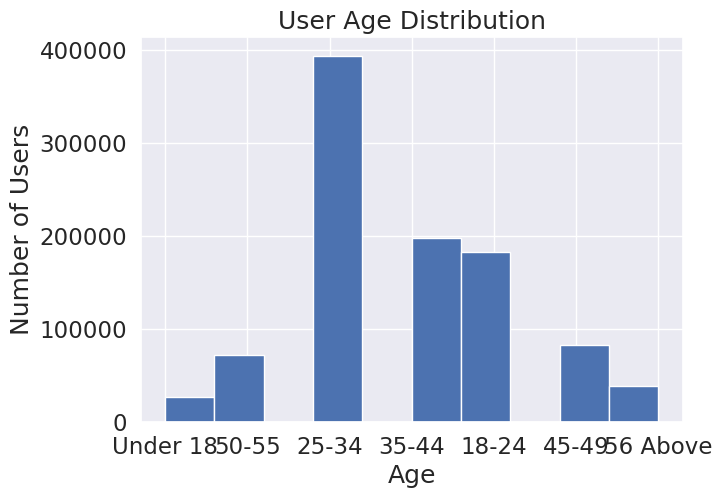

In [51]:
data['Age'].hist(figsize=(7, 5))
plt.title('User Age Distribution')
plt.xlabel('Age')
plt.ylabel('Number of Users')
plt.show()

From the above plot we can infer that **25-34 age group** have watched and rated the most number of movies

#### **Distribution by Gender -**

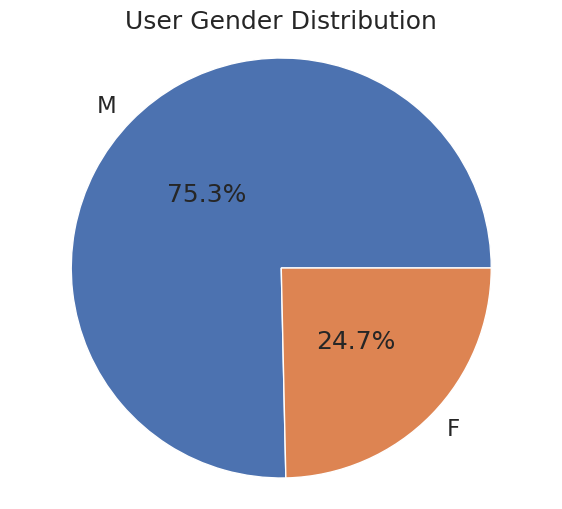

In [52]:
x = data['Gender'].value_counts().values
plt.figure(figsize=(7, 6))
plt.pie(x, center=(0, 0), radius=1.5, labels=['M','F'], autopct='%1.1f%%', pctdistance=0.5)
plt.title('User Gender Distribution')
plt.axis('equal')
plt.show()

From the above plot most of the users in our dataset who’ve rated the movies are **Male**.

#### **Distribution by Occupation -**

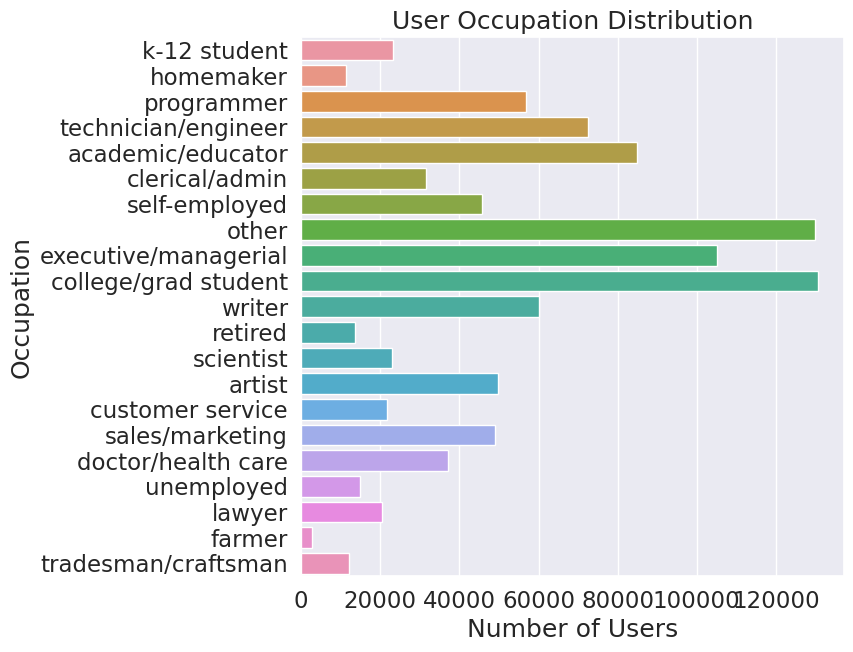

In [53]:
plt.figure(figsize=(7, 7))
sns.countplot(y='Occupation', data=data)
plt.title('User Occupation Distribution')
plt.xlabel('Number of Users')
plt.ylabel('Occupation')
plt.show()

From the above plot users belonging to **college/grad student** profession have watched and rated the most movies.

In [54]:
movies_rating_count = data.groupby(by=['Title'])['Rating'].count().reset_index()[['Title','Rating']]
movies_rating_count.rename(columns = {'Rating' : 'totalRatingCount'},inplace=True)
movies_rating_count.head()

,Title,totalRatingCount
0,"$1,000,000 Duck",37
1,'Night Mother,70
2,'Til There Was You,52
3,"'burbs, The",303
4,...And Justice for All,199


In [55]:
top10_movies=movies_rating_count[['Title','totalRatingCount']].sort_values(by='totalRatingCount',ascending=False).head(10)
top10_movies

,Title,totalRatingCount
125,American Beauty,3428
3099,Star Wars: Episode IV - A New Hope,2991
3100,Star Wars: Episode V - The Empire Strikes Back,2990
3101,Star Wars: Episode VI - Return of the Jedi,2883
1761,Jurassic Park,2672
2843,Saving Private Ryan,2653
3238,Terminator 2: Judgment Day,2649
2075,"Matrix, The",2590
256,Back to the Future,2583
2936,"Silence of the Lambs, The",2578


Text(0, 0.5, 'User Rating count')

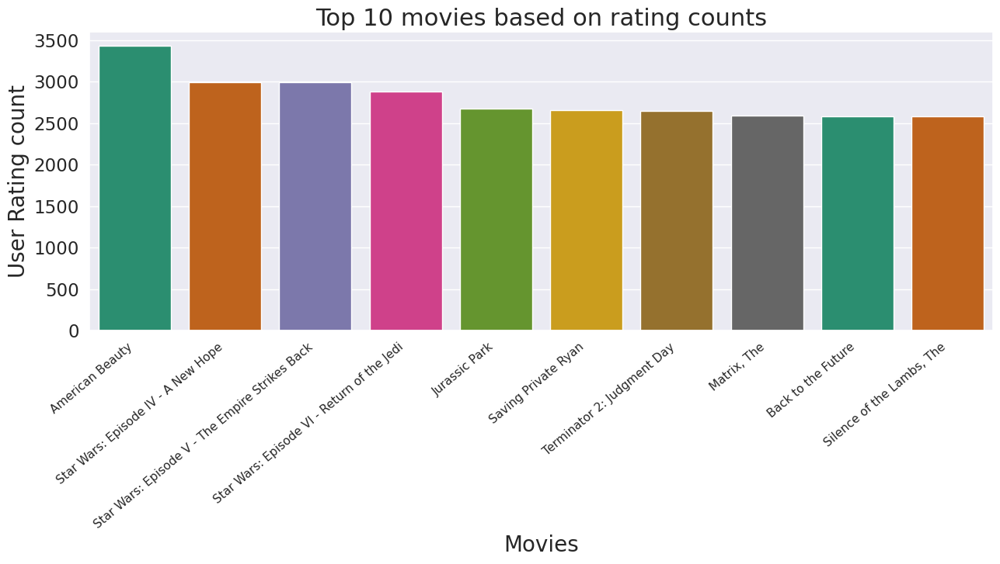

In [56]:
plt.figure(figsize=(15,5))
ax=sns.barplot(x="Title", y="totalRatingCount", data=top10_movies, palette="Dark2")
ax.set_xticklabels(ax.get_xticklabels(), fontsize=11, rotation=40, ha="right")
ax.set_title('Top 10 movies based on rating counts',fontsize = 22)
ax.set_xlabel('Movies',fontsize = 20) 
ax.set_ylabel('User Rating count', fontsize = 20)

From the above plot, the movie with maximum number of ratings is **American Beauty**.

# 5. Recommendations systems <a id='rec_sys'></a>

#### User-Interaction Matrix

Creating a pivot table of movie titles and userid and ratings are taken as values.

In [57]:
matrix = pd.pivot_table(data,index='UserID',columns='Title',values='Rating',aggfunc='mean')

# Imputing 'NaN' values with Zero rating 
matrix.fillna(0,inplace=True)
matrix.shape

(6040, 3640)

In [58]:
matrix.head(10)

Title   $1,000,000 Duck  'Night Mother  'Til There Was You  'burbs, The  \
UserID                                                                    
1                  0.00           0.00                0.00         0.00   
10                 0.00           0.00                0.00         4.00   
100                0.00           0.00                0.00         0.00   
1000               0.00           0.00                0.00         0.00   
1001               0.00           0.00                0.00         0.00   
1002               0.00           0.00                0.00         0.00   
1003               0.00           0.00                0.00         0.00   
1004               0.00           0.00                0.00         0.00   
1005               0.00           0.00                0.00         0.00   
1006               0.00           0.00                0.00         0.00   

Title   ...And Justice for All  1-900  10 Things I Hate About You  \
UserID                                                              
1                         0.00   0.00                        0.00   
10                        0.00   0.00                        0.00   
100                       0.00   0.00                        0.00   
1000                      0.00   0.00                        0.00   
1001                      0.00   0.00                        0.00   
1002                      0.00   0.00                        0.00   
1003                      0.00   0.00                        0.00   
1004                      0.00   0.00                        0.00   
1005                      0.00   0.00                        0.00   
1006                      0.00   0.00                        0.00   

Title   101 Dalmatians  12 Angry Men  13th Warrior, The  187  \
UserID                                                         
1                 0.00          0.00               0.00 0.00   
10                0.00          3.00               4.00 0.00   
100               0.00          0.00               0.00 0.00   
1000              4.00          0.00               0.00 0.00   
1001              3.00          0.00               0.00 0.00   
1002              0.00          0.00               0.00 0.00   
1003              0.00          0.00               0.00 0.00   
1004              4.00          0.00               0.00 0.00   
1005              0.00          0.00               0.00 0.00   
1006              0.00          0.00               0.00 0.00   

Title   2 Days in the Valley  20 Dates  20,000 Leagues Under the Sea  \
UserID                                                                 
1                       0.00      0.00                          0.00   
10                      0.00      0.00                          4.00   
100                     0.00      0.00                          0.00   
1000                    0.00      0.00                          0.00   
1001                    0.00      0.00                          0.00   
1002                    0.00      0.00                          0.00   
1003                    0.00      0.00                          0.00   
1004                    0.00      0.00                          0.00   
1005                    0.00      0.00                          0.00   
1006                    0.00      0.00                          0.00   

Title   200 Cigarettes  2001: A Space Odyssey  2010  24 7: Twenty Four Seven  \
UserID                                                                         
1                 0.00                   0.00  0.00                     0.00   
10                0.00                   3.00  0.00                     0.00   
100               0.00                   4.00  0.00                     0.00   
1000              0.00                   0.00  0.00                     0.00   
1001              1.00                   0.00  0.00                     0.00   
1002              0.00                   0.00  0.00                     0.00

In [59]:
# Checking data sparsity
n_users = data['UserID'].nunique()
n_movies = data['MovieID'].nunique()
sparsity = round(1.0 - data.shape[0] / float( n_users * n_movies), 3)
print('The sparsity level of dataset is ' +  str(sparsity * 100) + '%')

The sparsity level of dataset is 95.5%


## 5.1 Pearson Correlation <a id='pear'></a>

Correlation is a measure that tells how closely two variables move in the same or opposite direction. A positive value indicates that they move in the same direction (i.e. if one increases other increases), where as a negative value indicates the opposite.

The most popular correlation measure for numerical data is Pearson’s Correlation. This measures
the degree of linear relationship between two numeric variables and lies between -1 to +1. It is
represented by ‘r’.

* r=1 means perfect positive correlation
* r=-1 means perfect negative correlation
* r=0 means no linear correlation (note, it does not mean no correlation)


#### Item - Based approach

We will take a movie name as an input from the user and see which other 5 (five) movies have maximum correlation with it.

In [60]:
data[data['Title']=='Home Alone']

,MovieID,Title,Genres,Year,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,Datatime,ReleaseDec
415,586,Home Alone,"[Children's, Comedy]",1990,10,3,978228747,F,35-44,academic/educator,95370,2000-12-31 02:12:27,90s
822,586,Home Alone,"[Children's, Comedy]",1990,18,4,978155233,F,18-24,clerical/admin,95825,2000-12-30 05:47:13,90s
1742,586,Home Alone,"[Children's, Comedy]",1990,26,2,978140049,M,25-34,executive/managerial,23112,2000-12-30 01:34:09,90s
2705,586,Home Alone,"[Children's, Comedy]",1990,38,4,978046369,F,18-24,college/grad student,02215,2000-12-28 23:32:49,90s
3015,586,Home Alone,"[Children's, Comedy]",1990,45,3,977991192,F,45-49,self-employed,94110,2000-12-28 08:13:12,90s
...,...,...,...,...,...,...,...,...,...,...,...,...,...
975134,586,Home Alone,"[Children's, Comedy]",1990,4273,5,9891186,M,45-49,retired,3003,1970-04-25 11:33:06,90s
977745,586,Home Alone,"[Children's, Comedy]",1990,3385,3,9675647,F,25-34,homemaker,32212,1970-04-22 23:40:47,90s
981262,586,Home Alone,"[Children's, Comedy]",1990,3633,4,9665260,M,35-44,tradesman/craftsman,6044,1970-04-22 20:47:40,90s
990597,586,Home Alone,"[Children's, Comedy]",1990,4846,3,9628340,F,25-34,artist,90066,1970-04-22 10:32:20,90s


In [61]:
#movie_name = input("Enter a movie name: ")
movie_name = 'Home Alone'
# Taking the ratings of that movie
movie_rating = matrix[movie_name]
movie_rating

UserID
1      0.00
10     3.00
100    0.00
1000   0.00
1001   0.00
       ... 
995    0.00
996    0.00
997    0.00
998    0.00
999    0.00
Name: Home Alone, Length: 6040, dtype: float64

In [62]:
similar_movies = matrix.corrwith(movie_rating)
#Finding similar movies

sim_df = pd.DataFrame(similar_movies, columns=['Correlation'])
# Sorting the values based on correlation
sim_df.sort_values('Correlation', ascending=False,inplace=True)

#Top 5 correlated movies.
sim_df.iloc[1:, :].head()

,Correlation
Title,
Home Alone 2: Lost in New York,0.55
Mrs. Doubtfire,0.47
Liar Liar,0.46
"Mighty Ducks, The",0.45
Sister Act,0.44


## 5.2 Cosine Similarty <a id='cosine'></a>

Cosine similarity is a measure of similarity between two sequences of numbers. Those sequences are viewed as vectors in a higher dimensional space, and the cosine similarity is defined as the cosine of the angle between them, i.e. the dot product of the vectors divided by the product of their lengths.

The cosine similarity always belongs to the interval [-1,1]. For example, two proportional vectors have a cosine similarity of 1, two orthogonal vectors have a similarity of 0, and two opposite vectors have a similarity of -1.

In [63]:
#Finding the similarity values between item-item using cosine_similarity
item_sim = cosine_similarity(matrix.T)
item_sim

array([[1.        , 0.07235746, 0.03701053, ..., 0.        , 0.12024178,
        0.02700277],
       [0.07235746, 1.        , 0.11528952, ..., 0.        , 0.        ,
        0.07780705],
       [0.03701053, 0.11528952, 1.        , ..., 0.        , 0.04752635,
        0.0632837 ],
       ...,
       [0.        , 0.        , 0.        , ..., 1.        , 0.        ,
        0.04564448],
       [0.12024178, 0.        , 0.04752635, ..., 0.        , 1.        ,
        0.04433508],
       [0.02700277, 0.07780705, 0.0632837 , ..., 0.04564448, 0.04433508,
        1.        ]])

### 5.2.1 Item-Based Similarity<a id='itm_sim'></a>

In [64]:
#Item-similarity Matrix
item_sim_matrix = pd.DataFrame(item_sim, index=matrix.columns, columns=matrix.columns)
item_sim_matrix.head()

Title                   $1,000,000 Duck  'Night Mother  'Til There Was You  \
Title                                                                        
$1,000,000 Duck                    1.00           0.07                0.04   
'Night Mother                      0.07           1.00                0.12   
'Til There Was You                 0.04           0.12                1.00   
'burbs, The                        0.08           0.12                0.10   
...And Justice for All             0.06           0.16                0.07   

Title                   'burbs, The  ...And Justice for All  1-900  \
Title                                                                
$1,000,000 Duck                0.08                    0.06   0.00   
'Night Mother                  0.12                    0.16   0.00   
'Til There Was You             0.10                    0.07   0.08   
'burbs, The                    1.00                    0.14   0.00   
...And Justice for All         0.14                    1.00   0.00   

Title                   10 Things I Hate About You  101 Dalmatians  \
Title                                                                
$1,000,000 Duck                               0.06            0.19   
'Night Mother                                 0.08            0.14   
'Til There Was You                            0.13            0.13   
'burbs, The                                   0.19            0.25   
...And Justice for All                        0.08            0.18   

Title                   12 Angry Men  13th Warrior, The  187  \
Title                                                          
$1,000,000 Duck                 0.09               0.06 0.03   
'Night Mother                   0.11               0.05 0.06   
'Til There Was You              0.08               0.07 0.02   
'burbs, The                     0.17               0.20 0.10   
...And Justice for All          0.21               0.12 0.11   

Title                   2 Days in the Valley  20 Dates  \
Title                                                    
$1,000,000 Duck                         0.02      0.02   
'Night Mother                           0.11      0.04   
'Til There Was You                      0.07      0.09   
'burbs, The                             0.18      0.05   
...And Justice for All                  0.20      0.04   

Title                   20,000 Leagues Under the Sea  200 Cigarettes  \
Title                                                                  
$1,000,000 Duck                                 0.14            0.09   
'Night Mother                                   0.07            0.14   
'Til There Was You                              0.03            0.20   
'burbs, The                                     0.19            0.24   
...And Justice for All                          0.17            0.11   

Title                   2001: A Space Odyssey  2010  24 7: Twenty Four Seven  \
Title                                                                          
$1,000,000 Duck                          0.07  0.04                     0.00   
'Night Mother                            0.10  0.08                     0.06   
'Til There Was You                       0.06  0.04                     0.00   
'burbs, The                              0.20  0.19                     0.00   
...And Justice for All                   0.22  0.15                     0.08   

Title                   24-hour Woman  28 Days  \
Title                                            
$1,000,000 Duck                  0.00     0.06   
'Night Mother                    0.06     0.06   
'Til There Was You               0.17     0.12   
'burbs, The                      0.04     0.12   
...And Justice for All           0.02     0.09   

Title                   3 Ninjas: High Noon On Mega Mountain  3 Strikes  \
Title                                                                     
$1,000,000 Duck                                 

### 5.2.2 User-Based Similarity<a id='user_sim'></a>

In [65]:
#Finding the similarity values between user-user using cosine_similarity
user_sim = cosine_similarity(matrix)
user_sim

array([[1.        , 0.25531859, 0.12396703, ..., 0.15926709, 0.11935626,
        0.12239079],
       [0.25531859, 1.        , 0.25964457, ..., 0.16569953, 0.13332665,
        0.24845029],
       [0.12396703, 0.25964457, 1.        , ..., 0.20430203, 0.11352239,
        0.30693676],
       ...,
       [0.15926709, 0.16569953, 0.20430203, ..., 1.        , 0.18657496,
        0.18563871],
       [0.11935626, 0.13332665, 0.11352239, ..., 0.18657496, 1.        ,
        0.10827118],
       [0.12239079, 0.24845029, 0.30693676, ..., 0.18563871, 0.10827118,
        1.        ]])

In [66]:
user_sim_matrix = pd.DataFrame(user_sim, index=matrix.index, columns=matrix.index)
user_sim_matrix.head()

UserID    1   10  100  1000  1001  1002  1003  1004  1005  1006  1007  1008  \
UserID                                                                        
1      1.00 0.26 0.12  0.21  0.14  0.11  0.12  0.18  0.10  0.05  0.06  0.10   
10     0.26 1.00 0.26  0.28  0.16  0.11  0.14  0.43  0.19  0.10  0.16  0.22   
100    0.12 0.26 1.00  0.31  0.08  0.11  0.36  0.24  0.17  0.10  0.06  0.04   
1000   0.21 0.28 0.31  1.00  0.10  0.05  0.20  0.36  0.33  0.13  0.04  0.08   
1001   0.14 0.16 0.08  0.10  1.00  0.16  0.05  0.15  0.14  0.13  0.02  0.08   

UserID  1009  101  1010  1011  1012  1013  1014  1015  1016  1017  1018  1019  \
UserID                                                                          
1       0.05 0.03  0.16  0.08  0.08  0.05  0.20  0.18  0.13  0.15  0.18  0.11   
10      0.12 0.21  0.35  0.20  0.15  0.16  0.16  0.39  0.20  0.29  0.24  0.33   
100     0.06 0.35  0.26  0.14  0.09  0.02  0.30  0.20  0.17  0.15  0.34  0.19   
1000    0.12 0.28  0.25  0.12  0.12  0.05  0.18  0.22  0.09  0.20  0.36  0.20   
1001    0.20 0.07  0.25  0.07  0.04  0.07  0.06  0.30  0.29  0.10  0.07  0.17   

UserID  102  1020  1021  1022  1023  1024  1025  1026  1027  1028  1029  103  \
UserID                                                                         
1      0.12  0.03  0.09  0.12  0.10  0.02  0.03  0.00  0.14  0.05  0.19 0.03   
10     0.16  0.11  0.19  0.11  0.13  0.14  0.08  0.04  0.15  0.08  0.30 0.15   
100    0.01  0.18  0.20  0.07  0.09  0.07  0.07  0.03  0.21  0.10  0.16 0.22   
1000   0.10  0.14  0.17  0.06  0.05  0.02  0.12  0.03  0.15  0.07  0.22 0.17   
1001   0.18  0.15  0.10  0.27  0.05  0.07  0.12  0.13  0.08  0.05  0.16 0.10   

UserID  1030  1031  1032  1033  1034  1035  1036  1037  1038  1039  104  1040  \
UserID                                                                          
1       0.05  0.06  0.18  0.03  0.19  0.14  0.14  0.02  0.18  0.03 0.05  0.17   
10      0.24  0.27  0.23  0.20  0.33  0.13  0.17  0.05  0.18  0.06 0.09  0.33   
100     0.40  0.39  0.09  0.14  0.16  0.22  0.19  0.05  0.13  0.00 0.03  0.23   
1000    0.34  0.32  0.14  0.13  0.23  0.13  0.13  0.06  0.09  0.00 0.07  0.23   
1001    0.09  0.08  0.23  0.10  0.15  0.10  0.08  0.20  0.16  0.08 0.13  0.13   

UserID  1041  1042  1043  1044  1045  1046  1047  1048  1049  105  1050  1051  \
UserID                                                                          
1       0.05  0.08  0.08  0.15  0.06  0.03  0.14  0.15  0.07 0.10  0.14  0.25   
10      0.07  0.25  0.10  0.23  0.10  0.13  0.26  0.10  0.11 0.16  0.28  0.46   
100     0.08  0.05  0.09  0.19  0.00  0.09  0.26  0.14  0.18 0.26  0.16  0.21   
1000    0.04  0.05  0.06  0.26  0.04  0.09  0.20  0.05  0.09 0.45  0.14  0.24   
1001    0.08  0.02  0.06  0.02  0.14  0.05  0.14  0.19  0.14 0.05  0.37  0.31   

UserID  1052  1053  1054  1055  1056  1057  1058  1059  106  1060  1061  1062  \
UserID                                                                          
1       0.06  0.05  0.05  0.14  0.06  0.21  0.12  0.21 0.05  0.00  0.18  0.15   
10      0.14  0.19  0.23  0.20  0.14  0.30  0.34  0.34 0.17  0.11  0.16  0.29   
100     0.05  0.27  0.11  0.05  0.04  0.26  0.32  0.21 0.09  0.11  0.05  0.08   
1000    0.02  0.33  0.15  0.11  0.16  0.29  0.28  0.21 0.06  0.10  0.20  0.20   
1001    0.05  0.15  0.13  0.17  0.04  0.17  0.25  0.25 0.07  0.13  0.08  0.12   

UserID  1063  1064  1065  1066  1067  1068  1069  107  1070  1071  1072  1073  \
UserID                                                                          
1       0.10  0.12  0.03  0.10  0.12  0.24  0.03 0.12  0.04  0.07  0.23  0.07   
10      0.25  0.20  0.13  0.28  0.19  0.39  0.12 0.19  0.02  0.19  0.24  0.17   
100     0.26  0.17  0.03  0.20  0.18  0.19  0.10 0.17  0.13  0.19  0.17  0.13   
1000    0.30  0.15  0.01  0.14  0.11  0.18  0.04 0.13  0.04  0.11  0.17  0.09   
1001    0.14  0.24  0.21  0.13  0.17  0.23  0.29 0.04  0.08  0.12  0.15  0.11   

UserID  1074  1075  1076  1077  1078  1079  1

## 5.3 Nearest Neighbors <a id='nn'></a>

In [67]:
model_knn = NearestNeighbors(metric='cosine')
model_knn.fit(matrix.T)

NearestNeighbors(metric='cosine')

In [68]:
##The distances and indices are being calculated with neighbors being 6
distances, indices = model_knn.kneighbors(matrix.T,n_neighbors=6)

In [69]:
result = pd.DataFrame(indices, columns=['Title1','Title2','Title3', 'Title4', 'Title5', 'Title6'])
#The result dataframe consits of the different indices of movies based on the distance
result.head()

,Title1,Title2,Title3,Title4,Title5,Title6
0,0,735,416,286,584,3247
1,1,807,72,2167,3036,3369
2,2,1627,2529,3320,2588,1999
3,3,1457,2169,1308,1047,3511
4,4,26,726,894,495,944


In [70]:
##With this for loop replacing the indices in the result dataframe with movie titles of that corresponding ones
result2 = result.copy()
for i in range(1, 7):
    mov = pd.DataFrame(matrix.T.index).reset_index()
    mov = mov.rename(columns={'index':f'Title{i}'})
    result2 = pd.merge(result2, mov, on=[f'Title{i}'], how='left')
    result2 = result2.drop(f'Title{i}', axis=1)
    result2 = result2.rename(columns={'Title':f'Title{i}'})
result2.head()

,Title1,Title2,Title3,Title4,Title5,Title6
0,"$1,000,000 Duck","Computer Wore Tennis Shoes, The",Blackbeard's Ghost,"Barefoot Executive, The",Candleshoe,That Darn Cat!
1,'Night Mother,"Cry in the Dark, A",Agnes of God,Mommie Dearest,Sophie's Choice,"Trip to Bountiful, The"
2,'Til There Was You,If Lucy Fell,Picture Perfect,To Gillian on Her 37th Birthday,Practical Magic,Mad Love
3,"'burbs, The",Harry and the Hendersons,"Money Pit, The",Ghostbusters II,European Vacation,Weekend at Bernie's
4,...And Justice for All,52 Pick-Up,Coma,Deliverance,"Boys from Brazil, The",Dog Day Afternoon


In [71]:
#movie_name = input("Enter a movie name: ")
movie_name = 'Liar Liar'
#5 nearest movies for the movie present in Title1.
result2.loc[result2['Title1']==movie_name] 

,Title1,Title2,Title3,Title4,Title5,Title6
1887,Liar Liar,Mrs. Doubtfire,Ace Ventura: Pet Detective,Dumb & Dumber,Home Alone,Wayne's World


## 5.4 Matrix Factorization <a id='mf'></a>

Creating a pivot table of movie titles and userid and ratings are taken as values.

In [72]:
rm = data.pivot(index= 'UserID', columns= 'MovieID', values = 'Rating').fillna(0)
rm.head()

MovieID    1   10  100  1000  1002  1003  1004  1005  1006  1007  1008  1009  \
UserID                                                                         
1       5.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   
10      5.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  5.00   
100     0.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   
1000    5.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   
1001    4.00 0.00 0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   

MovieID  101  1010  1011  1012  1013  1014  1015  1016  1017  1018  1019  102  \
UserID                                                                          
1       0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
10      0.00  0.00  0.00  3.00  0.00  0.00  3.00  5.00  0.00  0.00  4.00 0.00   
100     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1000    0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1001    0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   

MovieID  1020  1021  1022  1023  1024  1025  1026  1027  1028  1029  103  \
UserID                                                                     
1        0.00  0.00  5.00  0.00  0.00  0.00  0.00  0.00  5.00  5.00 0.00   
10       3.00  0.00  5.00  5.00  0.00  4.00  0.00  0.00  5.00  0.00 0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1000     0.00  0.00  0.00  5.00  0.00  0.00  0.00  0.00  0.00  3.00 0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   

MovieID  1030  1031  1032  1033  1034  1035  1036  1037  1038  1039  104  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  5.00  0.00  0.00  0.00  0.00 0.00   
10       3.00  4.00  4.00  0.00  0.00  5.00  0.00  0.00  0.00  0.00 3.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00  4.00  0.00  0.00  0.00 0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00   

MovieID  1040  1041  1042  1043  1044  1046  1047  1049  105  1050  1051  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   
10       0.00  0.00  5.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00  2.00 0.00  0.00  0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00   

MovieID  1053  1054  1055  1056  1057  1058  1059  106  1060  1061  1062  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00   
10       0.00  0.00  0.00  0.00  0.00  0.00  5.00 0.00  0.00  0.00  0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00   
1001     0.00  0.00  0.00  0.00  0.00  0.00  2.00 0.00  0.00  0.00  0.00   

MovieID  1063  1064  1066  1067  1068  1069  107  1070  1071  1073  1076  \
UserID                                                                     
1        0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   
10       0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  5.00  0.00   
100      0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   
1000     0.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   
1001     2.00  0.00  0.00  0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00   

MovieID  1077  1078  1079  108  1080  1081  1082  1083  1084  1085  1086  \
UserID                                                                     
1        0.00  0.00  0.00 0.00  0.00  0.00  0.00  0.00

### 5.4.1 Using Cmfrec Library<a id='cmfrec'></a>

In [73]:
user_itm = data[['UserID', 'MovieID', 'Rating']].copy()
user_itm.columns = ['UserId', 'ItemId', 'Rating']
# Lib requires specific column names
user_itm.head(2)

,UserId,ItemId,Rating
0,1,1,5
1,1,48,5


In [74]:
print(user_itm.shape)
print("No.of Users:",len(user_itm['UserId'].unique()))
print("No.of Items:",len(user_itm['ItemId'].unique()))

(996144, 3)
No.of Users: 6040
No.of Items: 3682


In [75]:
model = CMF(method="als",k=4,lambda_=0.1,user_bias=False,item_bias=False,verbose=False)
model.fit(user_itm) #Fitting the model

Collective matrix factorization model
(explicit-feedback variant)


In [76]:
model.A_.shape, model.B_.shape
#model.A_ gives the embeddings of Users and model.B_ gives the embeddings of Items.

((6040, 4), (3682, 4))

In [77]:
user_itm.Rating.mean(), model.glob_mean_ # Average rating and Global Mean

(3.57998542379415, 3.5799853801727295)

In [78]:
rm__ = np.dot(model.A_, model.B_.T) + model.glob_mean_ #Calculating the predicted ratings

In [79]:
rmse = mean_squared_error(rm.values[rm > 0], rm__[rm > 0], squared=False) # Calculating rmse value
print('Root Mean Squared Error : {:.3f}'.format(rmse))

Root Mean Squared Error : 1.415


In [80]:
mape = mean_absolute_percentage_error(rm.values[rm>0],rm__[rm>0]) # Calculating mape value
print('Mean Absolute Percentage Error : {:.3f}'.format(mape))

Mean Absolute Percentage Error : 0.409


**Embeddings for user-user similarity.**

In [81]:
user=cosine_similarity(model.A_)

user_sim_matrix=pd.DataFrame(user,index=matrix.index,columns=matrix.index)
user_sim_matrix.head() #User similarity matrix using the embeddings from matrix factorization

UserID     1    10   100  1000  1001  1002  1003  1004  1005  1006  1007  \
UserID                                                                     
1       1.00 -0.09  0.36 -0.25  0.72  0.33 -0.01 -0.63 -0.45 -0.57 -0.46   
10     -0.09  1.00 -0.51  0.06  0.58  0.33  0.15 -0.57  0.04  0.78  0.29   
100     0.36 -0.51  1.00  0.66 -0.07  0.49  0.66  0.44  0.45 -0.26  0.13   
1000   -0.25  0.06  0.66  1.00 -0.20  0.54  0.92  0.58  0.89  0.53  0.57   
1001    0.72  0.58 -0.07 -0.20  1.00  0.60 -0.02 -0.88 -0.45  0.05 -0.00   

UserID  1008  1009   101  1010  1011  1012  1013  1014  1015  1016  1017  \
UserID                                                                     
1       0.42  0.84 -0.03  0.05 -0.49 -0.46  0.10  0.76  0.13 -0.13  0.62   
10      0.37 -0.24  0.83  0.90  0.84  0.54  0.11  0.45  0.50  0.96  0.64   
100     0.59  0.77 -0.01 -0.19 -0.33  0.17  0.43  0.32  0.24 -0.31  0.10   
1000    0.69  0.24  0.51  0.27  0.42  0.84  0.47  0.17  0.47  0.32  0.14   
1001    0.50  0.53  0.56  0.69  0.21 -0.01  0.34  0.91  0.58  0.49  0.84   

UserID  1018  1019   102  1020  1021  1022  1023  1024  1025  1026  1027  \
UserID                                                                     
1      -0.32  0.08  0.60  0.54 -0.34  0.31 -0.16 -0.48 -0.45 -0.45  0.82   
10     -0.19 -0.40  0.12 -0.34  0.02  0.57 -0.31  0.78  0.79  0.27 -0.41   
100     0.14  0.90  0.14  0.93  0.28  0.41  0.81 -0.16 -0.19  0.32  0.70   
1000    0.19  0.76 -0.08  0.55  0.50  0.66  0.91  0.60  0.54  0.87  0.10   
1001   -0.14 -0.13  0.35  0.25 -0.06  0.58 -0.41  0.12  0.21 -0.30  0.27   

UserID  1028  1029   103  1030  1031  1032  1033  1034  1035  1036  1037  \
UserID                                                                     
1       0.14 -0.27 -0.12 -0.03 -0.04  0.67 -0.18 -0.68  0.51 -0.08 -0.70   
10     -0.30  0.37  0.02  0.75  0.65 -0.64  0.46  0.02  0.19  0.62 -0.27   
100     0.44 -0.02  0.73  0.16 -0.10  0.74  0.42  0.15  0.72 -0.03 -0.07   
1000    0.19  0.31  0.99  0.68  0.36  0.03  0.91  0.59  0.67  0.36  0.15   
1001    0.13  0.24 -0.14  0.44  0.20  0.20  0.14 -0.39  0.52  0.50 -0.56   

UserID  1038  1039   104  1040  1041  1042  1043  1044  1045  1046  1047  \
UserID                                                                     
1       0.21 -0.66 -0.08 -0.16  0.32  0.47  0.47  0.23  0.00  0.78  0.05   
10     -0.20  0.24  0.45  0.51  0.84 -0.12  0.32 -0.35 -0.58  0.48 -0.18   
100     0.93  0.02  0.33  0.35 -0.05  0.71  0.34  0.93  0.87 -0.02  0.72   
1000    0.86  0.55  0.69  0.86  0.28  0.44  0.27  0.74  0.72 -0.24  0.68   
1001    0.02 -0.22  0.35  0.12  0.73  0.43  0.74  0.01 -0.48  0.99  0.05   

UserID  1048  1049   105  1050  1051  1052  1053  1054  1055  1056  1057  \
UserID                                                                     
1       0.78 -0.73  0.04  0.00 -0.27  0.09 -0.05 -0.04  0.17  0.78  0.52   
10      0.01  0.26 -0.26  0.49  0.06 -0.10 -0.51  0.28  0.52 -0.46 -0.54   
100     0.73  0.12  0.86  0.33  0.41  0.42  0.91  0.59  0.09  0.86  0.63   
1000    0.40  0.79  0.89  0.74  0.65  0.31  0.82  0.93  0.27  0.27  0.04   
1001    0.58 -0.47 -0.24  0.17 -0.00  0.22 -0.41  0.06  0.65  0.28  0.21   

UserID  1058  1059  106  1060  1061  1062  1063  1064  1065  1066  1067  1068  \
UserID                                                                          
1      -0.27 -0.12 0.63  0.56  0.44 -0.09 -0.00  0.44 -0.33  0.73  0.31 -0.17   
10     -0.02  0.13 0.31 -0.40  0.09  0.50  0.68  0.81 -0.19  0.52 -0.15  0.38   
100     0.68  0.68 0.22  0.70  0.80  0.38  0.19 -0.31  0.62  0.10  0.54  0.29   
1000    0.97  0.97 0.11  0.20  0.74  0.85  0.68 -0.13  0.81  0.01  0.30  0.75   
1001   -0.21  0.00 0.53  0.33  0.40  0.17  0.35  0.79 -0.28  0.82  0.35 -0.05   

UserID  1069   107  1070  1071  1072  1073  1074  1075  1076  1077  1078  \
UserID                                                                     
1      -0.50 -0.48  0.85  0.68 -0.39 -0.31 -0.16 -0.12 -0.34  0.74  0.90   
10    

In [82]:
itm=cosine_similarity(model.B_)

itm_sim_matrix=pd.DataFrame(itm,index=user_itm['ItemId'].unique(),columns=user_itm['ItemId'].unique())
itm_sim_matrix.head() #Item similarity matrix using the embeddings from matrix factorization

1    48  150   260   527  531  588  594  595   608  661   720   745  \
1    1.00 -0.06 0.95  0.91  0.95 0.67 0.91 0.76 0.88  0.66 0.31  0.88  0.89   
48  -0.06  1.00 0.09 -0.39 -0.36 0.48 0.36 0.38 0.38 -0.48 0.40 -0.35 -0.44   
150  0.95  0.09 1.00  0.88  0.88 0.57 0.93 0.67 0.88  0.44 0.16  0.70  0.74   
260  0.91 -0.39 0.88  1.00  0.98 0.31 0.70 0.44 0.62  0.68 0.03  0.81  0.90   
527  0.95 -0.36 0.88  0.98  1.00 0.45 0.74 0.58 0.71  0.73 0.13  0.91  0.96   

      783  914   919   938  1022  1028  1029  1035  1097  1193  1197  1207  \
1    0.24 0.88  0.95  0.29  0.75  0.80  0.71  0.74  0.98  0.86  0.96  0.91   
48   0.91 0.27 -0.03  0.76  0.53  0.44  0.49  0.50  0.16 -0.49 -0.31 -0.24   
150  0.29 0.81  0.83  0.26  0.72  0.76  0.63  0.73  0.97  0.71  0.89  0.76   
260 -0.15 0.61  0.78 -0.13  0.41  0.48  0.36  0.42  0.82  0.91  0.98  0.81   
527 -0.06 0.73  0.89  0.03  0.53  0.60  0.49  0.54  0.87  0.94  0.99  0.91   

     1246  1270  1287  1545  1566  1721  1836  1907  1961  1962  2018  2028  \
1    0.97  0.92  0.98  0.40  0.43  0.63 -0.21  0.79  0.98  0.91  0.74  0.90   
48  -0.02  0.02 -0.11  0.32  0.84  0.59  0.31  0.54 -0.05  0.33  0.44 -0.32   
150  0.98  0.98  0.97  0.21  0.55  0.81 -0.36  0.88  0.97  0.88  0.65  0.90   
260  0.93  0.91  0.96  0.05  0.14  0.46 -0.40  0.55  0.93  0.66  0.40  0.99   
527  0.92  0.87  0.96  0.24  0.15  0.43 -0.34  0.59  0.94  0.74  0.54  0.95   

     2294  2321  2340  2355  2398  2687  2692  2762  2791  2797  2804  2918  \
1    0.59  0.86  0.21  0.96  0.90  0.75  0.70  0.92  0.74  0.95  0.94  0.86   
48   0.63  0.24  0.82  0.15  0.32  0.62 -0.49 -0.28 -0.37  0.23 -0.34 -0.29   
150  0.60  0.79  0.41  0.93  0.86  0.81  0.52  0.93  0.67  0.96  0.85  0.84   
260  0.31  0.67  0.03  0.81  0.64  0.47  0.77  0.99  0.85  0.79  0.97  0.95   
527  0.35  0.71 -0.04  0.85  0.74  0.52  0.78  0.96  0.79  0.82  0.98  0.89   

     3105  3114  3186  3408   17   34  266   296  364  368  377   383   569  \
1    0.94  1.00  0.62  0.91 0.79 0.83 0.49  0.55 0.90 0.46 0.64  0.18  0.06   
48   0.24 -0.12  0.61  0.29 0.28 0.15 0.53 -0.63 0.28 0.49 0.58  0.72  0.98   
150  0.96  0.94  0.68  0.98 0.67 0.69 0.68  0.41 0.98 0.66 0.81  0.41  0.21   
260  0.79  0.93  0.39  0.77 0.48 0.57 0.42  0.74 0.78 0.42 0.48  0.08 -0.25   
527  0.80  0.97  0.39  0.77 0.63 0.71 0.32  0.69 0.77 0.30 0.44 -0.03 -0.24   

     590  597  838   912  920  1007  1030  1043  1088  1101  1188  1210  1296  \
1   0.93 0.63 0.71  0.90 0.87 -0.00  0.10 -0.18  0.40  0.63  0.51  0.85  0.51   
48  0.18 0.57 0.46 -0.30 0.33  0.99  0.95  0.90  0.88  0.40  0.30 -0.11  0.28   
150 0.99 0.82 0.62  0.74 0.82  0.13  0.16 -0.03  0.55  0.83  0.33  0.92  0.32   
260 0.84 0.48 0.36  0.82 0.59 -0.33 -0.27 -0.40  0.10  0.58  0.18  0.92  0.18   
527 0.82 0.44 0.50  0.92 0.70 -0.30 -0.21 -0.45  0.12  0.50  0.35  0.84  0.36   

     1380  1441  1569  1674  1688  1806  1947  1959  2006  2017  2081  2082  \
1    0.70  0.59  0.36  0.97  0.43 -0.20  0.83  0.55  0.54 -0.27  0.83 -0.06   
48   0.66  0.65  0.83  0.12  0.87  0.97  0.24  0.62  0.65  0.94  0.49  0.97   
150  0.81  0.63  0.56  0.92  0.56 -0.11  0.71  0.48  0.74 -0.19  0.83  0.13   
260  0.44  0.33  0.12  0.80  0.10 -0.54  0.54  0.16  0.39 -0.61  0.54 -0.32   
527  0.46  0.34  0.10  0.87  0.15 -0.49  0.68  0.31  0.33 -0.55  0.62 -0.34   

     2100  2396  2406  2469  2506  2802  2858  2966  3072  3074  3501  3508  \
1    0.61  0.99  0.83  0.32  0.29  0.01  0.68  0.78  0.70  0.84  0.57  0.85   
48   0.71 -0.03  0.45  0.79  0.79  0.84 -0.58 -0.29  0.42 -0.18  0.76 -0.31   
150  0.67  0.92  0.92  0.32  0.51  0.17  0.54  0.57  0.59  0.83  0.60  0.83   
260  0.32  0.86  0.65 -0.03  0.12 -0.18  0.82  0.70  0.36  0.90  0.20  0.95   
527  0.35  0.93  0.65  0.04  0.05 -0.25  0.79  0.79  0.51  0.83  0.29  0.89   

     3524  3534  3536  3565  3578  3600  3604  3610  3624  3682  3685  3699  \
1    0.59  0.04  0.80  0.20  0.78 -0.37  0.45 -0.42  0.72  0.64  0.63  0.60   
48   0.56  0.94  0.28  0.87 -0.18  0.94  0.7

In [83]:
movie_name='586'
movie_rating=itm_sim_matrix[movie_name]# Taking the ratings of that movie
print(movie_rating)

1       0.25
48      0.85
150     0.47
260     0.04
527    -0.01
        ... 
3280   -0.57
642     0.49
1915    0.41
3779   -0.01
1832    0.05
Name: 586, Length: 3682, dtype: float32


In [84]:
similar_movies=itm_sim_matrix.corrwith(movie_rating) # Finding similar movies

sim_df=pd.DataFrame(similar_movies,columns=['Correlation'])
sim_df.sort_values('Correlation',ascending=False,inplace=True) # Sorting the values based on correlation
sim_df.iloc[1:, :].head() # Top 5 correlated movies

,Correlation
2875,1.00
3482,1.00
3565,1.00
3594,1.00
653,1.00


In [85]:
item_mov=data[['MovieID','Title']].copy()
item_mov.drop_duplicates(inplace=True)
item_mov.reset_index(drop=True,inplace=True)

sim_df1=sim_df.copy()
sim_df1.reset_index(inplace=True)
sim_df1.rename(columns={'index':'MovieID'},inplace=True)
sim_mov=pd.merge(sim_df1,item_mov,on='MovieID',how='inner')
sim_mov.head(6)

,MovieID,Correlation,Title
0,586,1.00,Home Alone
1,2875,1.00,Sommersby
2,3482,1.00,Price of Glory
3,3565,1.00,Where the Heart Is
4,3594,1.00,Center Stage
5,653,1.00,Dragonheart


In [86]:
model1=CMF(method="als",k=2,lambda_=0.1,user_bias=False,item_bias=False,verbose=False)
model1.fit(user_itm)

Collective matrix factorization model
(explicit-feedback variant)


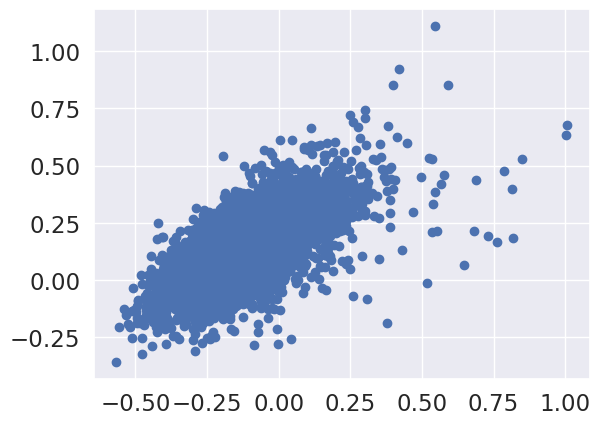

In [87]:
plt.scatter(model1.A_[:,0],model1.A_[:,1],cmap='hot')

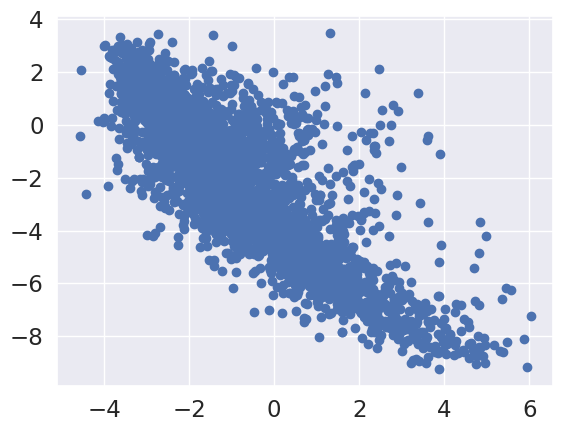

In [88]:
plt.scatter(model1.B_[:,0], model1.B_[:,1],cmap='hot')

### 5.4.2 Using Surprise Library<a id='surprise'></a>

In [89]:
from surprise import Reader, SVD, Dataset
from surprise.model_selection import cross_validate

In [90]:
data.Rating.value_counts()

4    347758
3    260473
5    224639
2    107261
1     56013
Name: Rating, dtype: int64

In [91]:
##The Reader class is used to parse a file containing ratings.It orders the data in format of (userid,title,rating) and even by
##considering the rating scale
user_itm=data[['UserID','Title','Rating']].copy()
reader=Reader(rating_scale=(1,5))
data1=Dataset.load_from_df(user_itm[['UserID','Title','Rating']],reader)

In [92]:
print(user_itm.shape)
print("No.of Users:",len(user_itm['UserID'].unique()))
print("No.of Items:",len(user_itm['Title'].unique()))

(996144, 3)
No.of Users: 6040
No.of Items: 3640


In [93]:
svd=SVD()
cross_validate(svd,data1,measures=['rmse'],cv=3,return_train_measures=True)
##The dataset is divided into train and test and with 3 folds the rmse has been calculated

{'test_rmse': array([0.88585563, 0.88617607, 0.88787229]),
 'train_rmse': array([0.67110785, 0.67161494, 0.67097926]),
 'fit_time': (12.70289659500122, 11.933066844940186, 12.831824779510498),
 'test_time': (5.218743085861206, 4.503496170043945, 4.723477125167847)}

In [94]:
trainset=data1.build_full_trainset()
svd.fit(trainset) ##Fitting the trainset with the help of svd

In [95]:
svd.pu.shape , svd.qi.shape 
#pu gives the embeddings of Users and qi gives the embeddings of Items.

((6040, 100), (3640, 100))

In [96]:
#Storing all the movie titles in items
items = movies['Title'].unique()
##Considering the user '662' 
test = [[662, iid, 4] for iid in items]
##Finding the user predictions(ratings) for all the movies
predictions = svd.test(test)
pred = pd.DataFrame(predictions)

In [97]:
a = pred.sort_values(by='est', ascending=False) ##Sorting the values based on the estimated predictions

In [98]:
a[0:10] ##TOP 10

,uid,iid,r_ui,est,details
2806,662,Sanjuro,4,4.71,{'was_impossible': False}
315,662,"Shawshank Redemption, The",4,4.52,{'was_impossible': False}
49,662,"Usual Suspects, The",4,4.50,{'was_impossible': False}
1130,662,"Wrong Trousers, The",4,4.50,{'was_impossible': False}
892,662,Rear Window,4,4.48,{'was_impossible': False}
735,662,"Close Shave, A",4,4.47,{'was_impossible': False}
523,662,Schindler's List,4,4.46,{'was_impossible': False}
1187,662,To Kill a Mockingbird,4,4.46,{'was_impossible': False}
847,662,"Godfather, The",4,4.46,{'was_impossible': False}
900,662,Casablanca,4,4.45,{'was_impossible': False}


In [99]:
testset = trainset.build_anti_testset()

predictions_svd = svd.test(testset)

In [100]:
from surprise import accuracy
print('SVD - RMSE:', accuracy.rmse(predictions_svd, verbose=False))
print('SVD - MAE:', accuracy.mae(predictions_svd, verbose=False))

SVD - RMSE: 0.7002189795807272
SVD - MAE: 0.5426562495904286


**Embeddings for user-user similarity using surprise library.**

In [101]:
user=cosine_similarity(svd.pu)

user_sim_matrix=pd.DataFrame(user,index=matrix.index,columns=matrix.index)
user_sim_matrix.head()
#User similarity matrix using the embeddings from matrix factorization

UserID     1    10   100  1000  1001  1002  1003  1004  1005  1006  1007  \
UserID                                                                     
1       1.00  0.13  0.01  0.05 -0.07  0.08  0.15 -0.01 -0.00  0.10 -0.07   
10      0.13  1.00 -0.15 -0.26  0.39 -0.24 -0.07 -0.18 -0.12  0.01 -0.04   
100     0.01 -0.15  1.00  0.21 -0.13  0.02  0.03  0.03 -0.01  0.01 -0.15   
1000    0.05 -0.26  0.21  1.00 -0.25  0.04 -0.01 -0.01  0.04 -0.05 -0.24   
1001   -0.07  0.39 -0.13 -0.25  1.00 -0.01 -0.06 -0.11  0.03 -0.08  0.08   

UserID  1008  1009   101  1010  1011  1012  1013  1014  1015  1016  1017  \
UserID                                                                     
1       0.19  0.21  0.08  0.05  0.17 -0.00  0.20  0.09  0.09 -0.11  0.20   
10     -0.10  0.02  0.20  0.17  0.21 -0.08 -0.08  0.22  0.01  0.13  0.28   
100    -0.04  0.09 -0.01 -0.11  0.05  0.02  0.09 -0.18  0.01  0.00 -0.09   
1000    0.22  0.04 -0.05  0.01  0.03  0.14 -0.02 -0.03  0.07  0.03  0.02   
1001   -0.02 -0.01  0.11  0.21  0.12  0.05  0.00  0.09  0.13  0.05  0.31   

UserID  1018  1019   102  1020  1021  1022  1023  1024  1025  1026  1027  \
UserID                                                                     
1      -0.20  0.08 -0.15  0.02 -0.05 -0.06 -0.04  0.11  0.09  0.07 -0.06   
10     -0.10 -0.15  0.31 -0.10 -0.13  0.09  0.11  0.12  0.23  0.05  0.19   
100    -0.06  0.15 -0.04  0.13  0.03 -0.05  0.10 -0.03 -0.06  0.02 -0.04   
1000   -0.12  0.11 -0.26  0.09 -0.16 -0.09 -0.10  0.03  0.03  0.09 -0.16   
1001    0.01  0.06  0.20 -0.02 -0.03  0.29  0.03  0.18  0.03  0.04  0.16   

UserID  1028  1029   103  1030  1031  1032  1033  1034  1035  1036  1037  \
UserID                                                                     
1      -0.04 -0.08 -0.24  0.06 -0.04 -0.17  0.09 -0.17  0.01  0.05 -0.12   
10      0.07  0.06 -0.01  0.08  0.17 -0.06  0.04 -0.28  0.07 -0.06 -0.06   
100     0.07 -0.13 -0.02  0.19 -0.09 -0.16 -0.05 -0.00 -0.02  0.08 -0.10   
1000   -0.09 -0.08 -0.01 -0.08 -0.05 -0.17  0.11  0.05  0.06 -0.03 -0.34   
1001    0.06 -0.05  0.10  0.10  0.33 -0.09 -0.03 -0.14 -0.01 -0.09 -0.01   

UserID  1038  1039   104  1040  1041  1042  1043  1044  1045  1046  1047  \
UserID                                                                     
1      -0.05  0.02  0.10  0.17  0.10  0.05  0.01 -0.09 -0.08  0.05 -0.06   
10     -0.06 -0.04  0.01 -0.07  0.27 -0.04  0.19 -0.02 -0.23  0.36 -0.22   
100     0.07 -0.08  0.05  0.07  0.09  0.14 -0.19  0.06 -0.06 -0.26  0.17   
1000    0.13  0.06  0.12  0.13  0.01  0.02 -0.02  0.18  0.15  0.03 -0.02   
1001    0.15 -0.19 -0.01  0.12  0.21 -0.06  0.08  0.05  0.00  0.35 -0.21   

UserID  1048  1049   105  1050  1051  1052  1053  1054  1055  1056  1057  \
UserID                                                                     
1      -0.10  0.04 -0.02  0.16  0.03 -0.16 -0.03 -0.02 -0.03 -0.10 -0.14   
10      0.03 -0.03  0.02  0.09 -0.26 -0.04 -0.26 -0.13  0.08 -0.01 -0.12   
100    -0.05  0.19 -0.18 -0.03  0.13  0.03  0.12 -0.03  0.06 -0.04 -0.06   
1000    0.07  0.07 -0.15  0.19 -0.02 -0.09  0.23  0.10  0.09 -0.02 -0.20   
1001    0.24  0.01  0.03  0.20 -0.28 -0.05 -0.24 -0.08  0.04 -0.07 -0.01   

UserID  1058  1059   106  1060  1061  1062  1063  1064  1065  1066  1067  \
UserID                                                                     
1       0.02  0.13 -0.04 -0.06  0.19 -0.00  0.06 -0.01  0.16  0.12  0.10   
10      0.04  0.05  0.18 -0.15  0.12  0.04  0.11  0.10 -0.40  0.23 -0.24   
100    -0.05  0.08 -0.00 -0.05  0.00  0.02  0.02  0.18  0.24 -0.11  0.16   
1000    0.09  0.13 -0.14  0.02  0.15  0.22  0.20 -0.02  0.23  0.08  0.05   
1001   -0.06  0.14  0.08  0.09  0.06  0.02  0.17  0.03 -0.11  0.02 -0.21   

UserID  1068  1069   107  1070  1071  1072  1073  1074  1075  1076  1077  \
UserID                                                                     
1       0.06  0.09  0.00 -0.03 -0.10  0.04 -0.04  0.21  0.02  0.04  0.04   
10      0.21 -0.04 -0.14  0.07  0.16 -0.2

**Embeddings for item-item similarity using surprise library.**

In [102]:
itm=cosine_similarity(svd.qi)

itm_sim_matrix = pd.DataFrame(itm, index=user_itm['Title'].unique(), columns=user_itm['Title'].unique())
itm_sim_matrix.head()
#Item similarity matrix using the embeddings from matrix factorization

Toy Story  Pocahontas  Apollo 13  \
Toy Story                                1.00        0.15       0.23   
Pocahontas                               0.15        1.00       0.13   
Apollo 13                                0.23        0.13       1.00   
Star Wars: Episode IV - A New Hope       0.25        0.01       0.12   
Schindler's List                         0.19        0.02       0.38   

                                    Star Wars: Episode IV - A New Hope  \
Toy Story                                                         0.25   
Pocahontas                                                        0.01   
Apollo 13                                                         0.12   
Star Wars: Episode IV - A New Hope                                1.00   
Schindler's List                                                  0.10   

                                    Schindler's List  Secret Garden, The  \
Toy Story                                       0.19                0.33   
Pocahontas                                      0.02                0.04   
Apollo 13                                       0.38                0.14   
Star Wars: Episode IV - A New Hope              0.10                0.04   
Schindler's List                                1.00                0.02   

                                    Aladdin  Snow White and the Seven Dwarfs  \
Toy Story                              0.58                             0.19   
Pocahontas                             0.27                             0.11   
Apollo 13                              0.20                             0.15   
Star Wars: Episode IV - A New Hope     0.23                             0.20   
Schindler's List                       0.24                             0.12   

                                    Beauty and the Beast  Fargo  \
Toy Story                                           0.45   0.08   
Pocahontas                                          0.25  -0.08   
Apollo 13                                           0.11   0.04   
Star Wars: Episode IV - A New Hope                  0.12   0.01   
Schindler's List                                    0.14   0.11   

                                    James and the Giant Peach  \
Toy Story                                                0.16   
Pocahontas                                               0.04   
Apollo 13                                               -0.19   
Star Wars: Episode IV - A New Hope                       0.20   
Schindler's List                                        -0.02   

                                    Wallace & Gromit: The Best of Aardman Animation  \
Toy Story                                                                      0.15   
Pocahontas                                                                    -0.06   
Apollo 13                                                                      0.09   
Star Wars: Episode IV - A New Hope                                             0.17   
Schindler's List                                                               0.13   

                                    Close Shave, A  \
Toy Story                                     0.16   
Pocahontas                                   -0.04   
Apollo 13                                    -0.12   
Star Wars: Episode IV - A New Hope            0.18   
Schindler's List                              0.07   

                                    Hunchback of Notre Dame, The  \
Toy Story                                                   0.27   
Pocahontas                                                  0.32   
Apollo 13                                                   0.16   
Star Wars: Episode IV - A New Hope                          0.03   
Schindler's List                                            0.19   

                                    My Fair Lady  Wizard of Oz, The  Gigi  \
Toy Story                                   0.14               0.24  0.08   
Pocahontas     

In [103]:
movie_name='Home Alone'
movie_rating = itm_sim_matrix[movie_name] # Taking the ratings of that movie
print(movie_rating)

Toy Story                               0.31
Pocahontas                              0.22
Apollo 13                               0.26
Star Wars: Episode IV - A New Hope      0.02
Schindler's List                        0.14
                                        ... 
Baby, The                              -0.05
Roula                                   0.06
Voyage to the Beginning of the World    0.02
Project Moon Base                      -0.16
Heaven's Burning                        0.06
Name: Home Alone, Length: 3640, dtype: float64


In [104]:
similar_movies = itm_sim_matrix.corrwith(movie_rating) #Finding similar movies

sim_df = pd.DataFrame(similar_movies, columns=['Correlation'])
sim_df.sort_values('Correlation', ascending=False, inplace=True) # Sorting the values based on correlation

sim_df.iloc[1: , :].head() #Top 5 correlated movies.

,Correlation
Home Alone 2: Lost in New York,0.74
Pretty Woman,0.67
Ghost,0.65
"Mighty Ducks, The",0.65
Mrs. Doubtfire,0.63


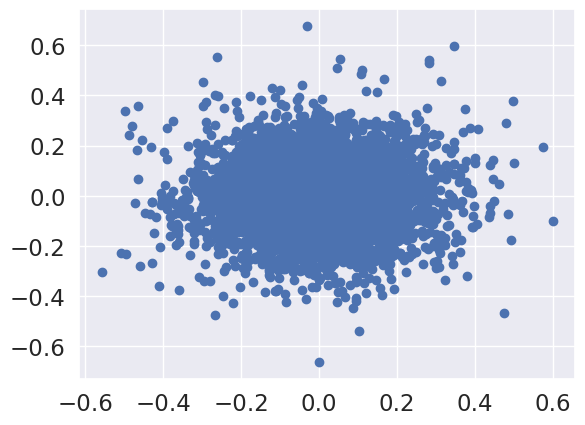

In [105]:
plt.scatter(svd.pu[:, 0], svd.pu[:, 1], cmap = 'hot')

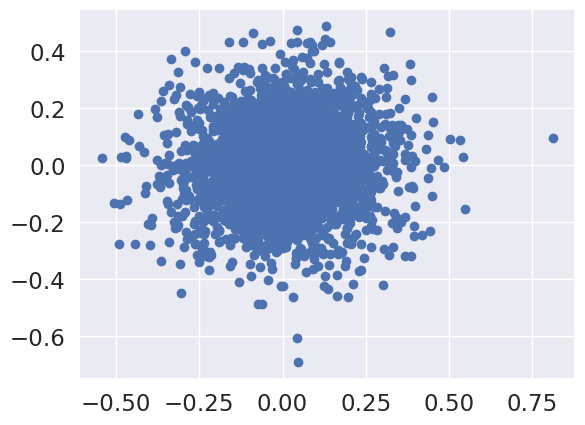

In [106]:
plt.scatter(svd.qi[:, 0], svd.qi[:, 1], cmap = 'hot')

## 5.5 User-Based Approach(optional)<a id='user_based'></a>

In [107]:
#Taking 6 movies names in random
mov_name = ['Hamlet', 'Dumb & Dumber', 'Ace Ventura: Pet Detective', 'Home Alone','Robin Hood','It Happened One Night']

In [108]:
#Finding the MovieID's for the above movies
mov_id=[]
for mov in mov_name:
    id=data[data['Title']==mov]['MovieID'].iloc[0]
    mov_id.append(id)

In [109]:
#mov_rating = list(map(int, input("Rate these movies respectively: ").split())) 
mov_rating = [5,3,2,1,4,3]#Give the random user rating for the movies

In [110]:
user_choices = pd.DataFrame({'MovieID': mov_id, 'Title': mov_name, 'Rating': mov_rating})
user_choices.sort_values(by='MovieID') #User choices

,MovieID,Title,Rating
0,1411,Hamlet,5
1,231,Dumb & Dumber,3
4,3034,Robin Hood,4
2,344,Ace Ventura: Pet Detective,2
3,586,Home Alone,1
5,905,It Happened One Night,3


In [111]:
other_users = data[data['MovieID'].isin(user_choices['MovieID'].values)] #Finding the similar users who watched same movies
other_users = other_users[['UserID', 'MovieID', 'Rating']]
other_users['UserID'].nunique()

1810

In [112]:
common_movies = other_users.groupby(['UserID']) #Grouping the data based on User who watched the common movies
common_movies = sorted(common_movies, key=lambda x: len(x[1]), reverse=True) #Soring the data so that who watched more number of common movies comes at the top.
common_movies[0] 

('1605',
        UserID MovieID  Rating
 154191   1605     231       2
 154238   1605     344       3
 154312   1605     586       3
 154367   1605     905       4
 154509   1605    1411       3
 154903   1605    3034       4)

In [113]:
top_users = common_movies[:100] #Taking top 100 users who watched same movies as in user choices.

In [114]:
#Calculating pearson correlation
pearson_corr = {}

for user_id, movies in top_users:
    movies = movies.sort_values(by='MovieID') 
    movie_list = movies['MovieID'].values #Taking list of movieid's

    new_user_ratings = user_choices[user_choices['MovieID'].isin(movie_list)]['Rating'].values # Taking the new user rating values based on user choices
    user_ratings = movies[movies['MovieID'].isin(movie_list)]['Rating'].values #Taking the actual rating values of the movies 
    
    corr = pearsonr(new_user_ratings, user_ratings) # Calculating the correlation
    pearson_corr[user_id] = corr[0] #Correlation value for each UserID

In [115]:
pearson_df = pd.DataFrame(columns=['UserID', 'Similarity Index'], data=pearson_corr.items()) # Creating a dataframe for UserId and Correlation values as 'Similarity Index'
pearson_df = pearson_df.sort_values(by='Similarity Index', ascending=False)[:10] #Showing for top 10 Users
pearson_df

,UserID,Similarity Index
99,3756,0.97
67,2109,0.97
87,3224,0.94
66,2106,0.87
40,1019,0.87
13,2288,0.87
27,48,0.87
70,2507,0.85
22,4016,0.80
31,5530,0.76


In [116]:
users_rating = pearson_df.merge(data, on='UserID', how='inner') #Merging the original data with pearson correlation values
users_rating['Weighted Rating'] = users_rating['Rating'] * users_rating['Similarity Index'] # Calculating the Weighed rating for each user and movie
users_rating = users_rating[['UserID', 'MovieID', 'Rating', 'Similarity Index', 'Weighted Rating']]
users_rating

,UserID,MovieID,Rating,Similarity Index,Weighted Rating
0,3756,1,5,0.97,4.84
1,3756,2,3,0.97,2.90
2,3756,11,4,0.97,3.87
3,3756,13,4,0.97,3.87
4,3756,24,3,0.97,2.90
...,...,...,...,...,...
7395,5530,3705,3,0.76,2.27
7396,5530,3712,2,0.76,1.51
7397,5530,3713,4,0.76,3.02
7398,5530,3723,3,0.76,2.27


In [117]:
# Calculate sum of similarity index and weighted rating for each movie
grouped_ratings = users_rating.groupby('MovieID').sum()[['Similarity Index', 'Weighted Rating']]

recommend_movies = pd.DataFrame()

# Add average recommendation score. 
# We're calculating average recommendation score by dividing the Weighted Rating by the Similarity Index.
recommend_movies['avg_reccomend_score'] = grouped_ratings['Weighted Rating']/grouped_ratings['Similarity Index']
recommend_movies['MovieID'] = grouped_ratings.index
recommend_movies = recommend_movies.reset_index(drop=True)

# Select movies with the highest score i.e. 5
recommend_movies = recommend_movies[(recommend_movies['avg_reccomend_score'] == 5)]

In [118]:
recommendations = data[data['MovieID'].isin(recommend_movies['MovieID'])][['MovieID', 'Title']].sample(10)
recommendations 

,MovieID,Title
463993,3726,Assault on Precinct 13
697038,2935,"Lady Eve, The"
825703,1300,My Life as a Dog (Mitt liv som hund)
127602,1296,"Room with a View, A"
652622,938,Gigi
843104,1251,8 1/2
637107,1066,Shall We Dance?
975934,2068,Fanny and Alexander
453688,1192,Paris Is Burning
695062,190,Safe


## 5.6 Regression Based Rec Sys<a id='reg'></a>

In [119]:
from sklearn.preprocessing import StandardScaler

In [120]:
movies1.head()

,MovieID,Title,Genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy


In [121]:
ratings1.head()

,UserID,MovieID,Rating,Timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291


In [122]:
users1.head()

,UserID,Gender,Age,Occupation,Zip-code
0,1,F,1,10,48067
1,2,M,56,16,70072
2,3,M,25,15,55117
3,4,M,45,7,02460
4,5,M,25,20,55455


In [123]:
m = pd.concat([movies1['MovieID'],genres_df.iloc[:,1:]],axis=1)
m.head()

,MovieID,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western
0,1,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,2,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,3,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00
3,4,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4,5,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [124]:
from datetime import datetime
r = ratings1.copy()
r['Timestamp']=r['Timestamp'].astype('int32')
r['Rating']=r['Rating'].astype('int32')
r['hour'] = r['Timestamp'].apply(lambda x: datetime.fromtimestamp(x).hour)
r.head()

,UserID,MovieID,Rating,Timestamp,hour
0,1,1193,5,978300760,22
1,1,661,3,978302109,22
2,1,914,3,978301968,22
3,1,3408,4,978300275,22
4,1,2355,5,978824291,23


In [125]:
users2 = users1.merge(r.groupby('UserID').Rating.mean().reset_index(), on='UserID')
users2 = users2.merge(r.groupby('UserID').hour.mean().reset_index(), on='UserID')
users2.head(2)

,UserID,Gender,Age,Occupation,Zip-code,Rating,hour
0,1,F,1,10,48067,4.19,22.25
1,2,M,56,16,70072,3.71,21.16


In [126]:
u = users2[['UserID','Age', 'Rating', 'hour']].copy()
u = u.set_index('UserID')
u .columns = ['Age', 'User_avg_rating', 'hour']

scaler = StandardScaler()
u = pd.DataFrame(scaler.fit_transform(u), columns=u.columns, index=u.index)
u.head(2)

,Age,User_avg_rating,hour
UserID,,,
1,-2.30,1.13,3.08
2,1.97,0.02,2.84


In [127]:
df_cat = users2[['Gender','Occupation']]
df_cat['Gender']=pd.get_dummies(df_cat['Gender'], columns=['Gender'],drop_first=True)
df_cat = pd.concat([users['UserID'],df_cat],axis=1)
df_cat.head()

,UserID,Gender,Occupation
0,1,0,10
1,2,1,16
2,3,1,15
3,4,1,7
4,5,1,20


In [128]:
X = ratings[['MovieID', 'UserID', 'Rating']].copy()
X = X.merge(u.reset_index(), on='UserID', how='right')
X = X.merge(m.reset_index(), on='MovieID', how='right')
X = X.merge(df_cat, on='UserID', how='right')
X.drop(columns=['index'], axis=1, inplace=True)
X.dropna(inplace=True)
X.reset_index(inplace=True,drop=True)
X1=X.copy()
X.head()

,MovieID,UserID,Rating,Age,User_avg_rating,hour,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,Gender,Occupation
0,1,1,5,-2.30,1.13,3.08,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,10
1,48,1,5,-2.30,1.13,3.08,0.00,0.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0,10
2,150,1,5,-2.30,1.13,3.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,10
3,260,1,4,-2.30,1.13,3.08,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,10
4,527,1,5,-2.30,1.13,3.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0,10


In [129]:
X = X.drop(columns = ['MovieID', 'UserID'])
y = X.pop('Rating')

In [130]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10)

In [131]:
from sklearn.ensemble import GradientBoostingRegressor

model = GradientBoostingRegressor()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

In [132]:
rmse = mean_squared_error(y_test, y_pred, squared=False) # calculating rmse value
print('Root Mean Squared Error: {:.3f}'.format(rmse))

Root Mean Squared Error: 1.008


In [133]:
mape =  mean_absolute_percentage_error(y_test, y_pred) #calculating mape value
print('Mean Absolute Percentage Error: {:.3f}'.format(mape))

Mean Absolute Percentage Error: 0.325


## 5.7 Ensemble Recommender System<a id='ene'></a>

In [134]:
X1.head()

,MovieID,UserID,Rating,Age,User_avg_rating,hour,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,Gender,Occupation
0,1,1,5,-2.30,1.13,3.08,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,10
1,48,1,5,-2.30,1.13,3.08,0.00,0.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0,10
2,150,1,5,-2.30,1.13,3.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,10
3,260,1,4,-2.30,1.13,3.08,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,10
4,527,1,5,-2.30,1.13,3.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0,10


In [135]:
y = X1.pop('Rating')

In [136]:
X_train, X_test, y_train, y_test = train_test_split(X1, y, test_size=0.2, random_state=10)

In [137]:
X_train1 = X_train[['MovieID', 'UserID']].copy()
X_train = X_train.drop(columns = ['MovieID', 'UserID'])
user_item_train=pd.concat([X_train1,y_train],axis=1)

In [138]:
X_test1 = X_test[['MovieID', 'UserID']].copy()
X_test = X_test.drop(columns = ['MovieID', 'UserID'])
user_item_test=pd.concat([X_test1,y_test],axis=1)

In [139]:
model = GradientBoostingRegressor()
model.fit(X_train, y_train)
y_pred_reg = model.predict(X_test)

In [140]:
user_item_test.columns = ['UserId', 'ItemId', 'Rating']  # Lib requires specific column names
user_item_test.head(2)

,UserId,ItemId,Rating
19971,2023,149,4
41412,2724,283,5


In [141]:
model = CMF(method="als", k=4, lambda_=0.1, user_bias=False, item_bias=False, verbose=False) 


In [142]:
model.fit(user_item_test)

Collective matrix factorization model
(explicit-feedback variant)


In [143]:
y_pred_mf = np.dot(model.A_, model.B_.T) + model.glob_mean_

In [144]:
df = pd.DataFrame(y_pred_mf,columns =list(model.item_mapping_),index=list(model.user_mapping_))
df.head()

149  283  3967  5646  957  5857  5096  1125  3643  479  999  673  2304  \
2023 3.60 4.47  2.67  2.37 3.84  3.87  2.16  3.25  3.44 3.67 3.17 2.45  3.73   
2724 2.79 5.13  1.83  2.01 3.67  3.74  2.12  3.09  2.94 3.36 3.69 2.18  3.58   
502  1.49 5.77  0.80  1.54 2.65  2.22  2.19  1.90  1.57 4.27 2.41 1.99  2.70   
1079 4.51 4.86  3.56  4.64 4.37  2.93  4.11  3.52  4.17 4.44 2.80 4.44  4.03   
2166 3.56 5.28  2.35  2.89 4.08  3.46  2.65  3.21  3.46 3.84 3.22 2.91  3.83   

      5107  3868  174  1632  3182  3336  1694  5912  2270  4465  884  2409  \
2023  2.76  3.37 3.45  1.83  2.51  2.70  3.22  3.86  2.20  2.91 3.62  3.81   
2724  2.44  3.39 3.19  1.34  1.90  2.21  2.91  2.47  3.39  1.03 3.90  3.47   
502   1.91  2.80 1.88  2.13  2.45  1.53  2.54  0.41  3.84 -0.67 2.16  3.00   
1079  3.53  3.63 3.27  3.37  4.43  3.64  4.15  3.56  3.79  3.69 4.12  4.31   
2166  2.72  3.46 3.20  1.76  2.73  2.61  3.38  2.99  3.27  1.98 4.06  3.90   

      2173  4009  4555  5046  5506   22  922  3955  360  4253  4294  1181  \
2023  3.26  2.66  2.37  3.18  3.86 2.60 3.53  2.69 4.17  2.94  3.07  2.86   
2724  2.39  2.13  1.41  2.29  3.46 2.15 2.44  2.62 3.86  2.81  2.97  2.26   
502   0.90  2.35  5.91  2.88  1.46 2.27 1.91  3.67 3.00  1.14  3.12  1.88   
1079  4.00  4.27  5.29  4.87  4.14 3.93 4.67  4.54 3.38  3.16  3.56  3.41   
2166  3.02  2.83  2.73  3.31  3.86 2.68 3.39  3.25 3.79  2.82  3.09  2.56   

      2550  4793  1746  1647  4344  4287  1671  1283  3600  3509  993  5628  \
2023  3.40  3.29  4.63  3.22  3.18  4.22  3.38  4.19  3.70  2.86 3.64  3.89   
2724  3.05  3.56  4.05  2.94  2.30  3.37  2.73  4.79  2.95  2.33 2.66  3.95   
502   2.19  0.90  2.65  1.91  1.40  2.15  2.41  2.64  2.74  1.53 2.36  0.00   
1079  3.54  3.20  4.89  4.11  4.23  4.63  4.58  3.24  4.75  4.09 3.18  3.15   
2166  3.22  3.38  4.71  3.38  3.05  4.10  3.50  4.32  3.77  2.93 2.85  3.74   

      2701  3945  740  4386  1680  5208  4169  4083  4845  1879  4803  3067  \
2023  2.95  3.19 3.24  3.17  3.95  4.12  3.62  2.84  3.46  3.98  3.95  3.46   
2724  2.63  2.54 3.77  3.23  3.58  3.05  2.95  1.51  3.54  3.28  4.46  3.01   
502   2.58  1.65 3.12  2.60  2.32  2.95  1.72  1.23  2.55  1.49  4.62  2.26   
1079  4.64  4.16 4.42  4.06  4.13  5.22  4.38  4.29  4.10  4.38  4.29  4.17   
2166  3.37  3.16 4.03  3.52  3.93  4.14  3.60  2.51  3.79  3.88  4.52  3.50   

      469  1521  692  2263  3180  4132  1094  5054  4579  5880  1628  2242  \
2023 3.49  3.65 3.47  3.54  2.29  3.27  3.34  2.96  3.44  3.10  2.74  4.01   
2724 3.91  2.42 2.95  3.85  1.77  3.20  2.76  2.71  2.72  2.63  2.40  4.10   
502  3.16  5.15 2.09  3.94  1.39  2.11  2.77  2.07  1.76  2.14  1.70  2.81   
1079 3.71  4.32 4.45  3.87  3.66  4.20  4.74  3.55  4.15  3.55  4.24  3.72   
2166 3.83  3.18 3.60  3.87  2.27  3.60  3.57  2.93  3.31  2.91  3.01  4.07   

      1263  2255  3650  3389  823  965  3951  5824  670  2031  5643  101  \
2023  2.99  4.03  3.80  2.74 3.83 3.65  4.27  3.30 2.09  3.16  3.31 4.30   
2724  2.17  3.64  3.57  1.98 3.84 3.19  3.33  2.89 1.02  2.38  2.30 4.69   
502   1.45  1.61  1.83  0.88 2.79 2.05  1.60  1.89 0.47  1.41  1.18 5.43   
1079  3.82  3.70  4.12  3.73 3.94 4.34  3.97  3.89 3.69  4.44  3.55 4.52   
2166  2.73  3.80  3.90  2.53 3.98 3.74  3.78  3.27 1.79  3.19  2.76 4.82   

      1199  5768  1608  3770  5326  1758  1727  1837  5875  5950  2684  4484  \
2023  3.20  3.96  1.45  3.48  3.34  2.90  3.64  3.37  3.66  2.59  2.96  3.82   
2724  2.49  3.07  0.65  2.53  3.72  2.87  3.35  2.82  2.87  2.31  2.27  2.28   
502   0.63  1.75  3.71  1.72  4.67  1.89  2.85  1.90  1.74  1.51  2.03  0.93   
1079  3.60  4.79  4.39  4.75  1.75  4.10  4.49  4.21  4.50  3.47  3.60  5.42   
2166  2.89  3.94  1.69  3.49  2.75  3.27  3.89  3.38  3.61  2.57  2.67  3.72   

      273  2181  2063  3675  5480  278  5387  1341  2555  2805  5091  1897  \
2023 3.54  3.78  2.80  3.30  2.90 3.89  3.15  2.46  2.41  3.94  3.62  3.38   
2724 3.89  2.66  2.54  2.70  2.94 3.36  2.89  5.36  2.62  4.25  3.46  2.79   
50

In [145]:
df1=df.unstack().reset_index()
df1.rename(columns={'level_0': 'ItemId', 'level_1': 'UserId',0:'Rating'}, inplace=True)
df1.tail()

,ItemId,UserId,Rating
20787125,1144,1098,2.20
20787126,1144,3458,2.93
20787127,1144,2198,3.44
20787128,1144,1160,3.54
20787129,1144,1138,3.63


In [146]:
df_mf = pd.merge(user_item_test, df1, on=['UserId','ItemId'], how='inner')
df_mf.rename(columns={'Rating_x': 'True_rating', 'Rating_y': 'Mf_pred_ratings'}, inplace=True)
df_mf.head()

,UserId,ItemId,True_rating,Mf_pred_ratings
0,2023,149,4,3.60
1,2724,283,5,5.13
2,502,3967,1,0.80
3,1079,5646,5,4.64
4,2166,957,4,4.08


In [147]:
df_gb=pd.DataFrame(y_pred_reg,columns =['reg_pred_ratings'])
df_reg= pd.concat([df_gb,df_mf['Mf_pred_ratings']],axis=1)
df_reg.head()

,reg_pred_ratings,Mf_pred_ratings
0,4.02,3.60
1,4.67,5.13
2,1.80,0.80
3,3.72,4.64
4,4.24,4.08


In [148]:
y = df_mf['True_rating']
X_train, X_test, y_train, y_test = train_test_split(df_reg, y, test_size=0.2, random_state=10)

In [149]:
from sklearn.linear_model import LinearRegression

In [150]:
model = LinearRegression().fit(X_train, y_train)

In [151]:
y_pred_en=model.predict(X_test)

In [152]:
rmse = mean_squared_error(y_test, y_pred_en, squared=False) # calculating rmse value
print('Root Mean Squared Error: {:.3f}'.format(rmse))

Root Mean Squared Error: 0.760


In [153]:
mape =  mean_absolute_percentage_error(y_test, y_pred_en) #calculating mape value
print('Mean Absolute Percentage Error: {:.3f}'.format(mape))

Mean Absolute Percentage Error: 0.218


###  Sparse ‘row’ matrix representation for the following dense matrix - [[1	0],[ 3	7]]

In [154]:
from scipy.sparse import csr_matrix
# create dense matrix
A = np.array([[1,0],[3,7]])
# convert to sparse matrix (CSR method)
S = csr_matrix(A)
print(S)

  (0, 0)	1
  (1, 0)	3
  (1, 1)	7
